# Capstone Project: Mapping the AI Global Job Market (2024-2025)
### Analyzing Global Trends in Salaries, Skills, Experience, and Remote Work

__Objectives:__

* To explore and visualize global trends in AI-related job roles, focusing on salary distribution, job types (remote vs. onsite), required skills, and country/region-wise demand. 
* The goal is to identify and model patterns that can inform job seekers, educators, and employers about the current state of the AI job market.



__Analysis Sections:__

1. Initial Data Exploration & Cleaning
2. Global Trends
3. Employment Type Trends
4. Skills & Experience Demand Trends
5. Industry & Company Trends
6. Time Series & Hiring Urgency


__Source:__

* https://www.kaggle.com/datasets/bismasajjad/global-ai-job-market-and-salary-trends-2025
* This dataset provides an extensive analysis of the artificial intelligence job market with over 15,000 ai-generated job postings. It includes detailed salary information, job requirements, company insights, and geographic trends.
* While synthetic, this data closely models real-time patterns in the global AI industry.


__Additional Research Resources:__

* Aura Job Market Research: https://blog.getaura.ai/ai-jobs

<br><br>

__1. Initial Data Exploration & Cleaning__

* Perform initial data exploration steps 
* Calculate high level statistical summaries
* Clean and transform dataset as needed


In [65]:
#Load ai_job_dataset.csv

import pandas as pd

df = pd.read_csv("/Users/danielmapes/Desktop/Capstone Project/ai_job_dataset.csv")

In [5]:
#return total number of rows and columns

df.shape 

(15000, 19)

In [6]:
#return first 5 rows

df.head(5)  

,job_id,job_title,salary_usd,salary_currency,experience_level,employment_type,company_location,company_size,employee_residence,remote_ratio,required_skills,education_required,years_experience,industry,posting_date,application_deadline,job_description_length,benefits_score,company_name
0,AI00001,AI Research Scientist,90376,USD,SE,CT,China,M,China,50,"Tableau, PyTorch, Kubernetes, Linux, NLP",Bachelor,9,Automotive,2024-10-18,2024-11-07,1076,5.9,Smart Analytics
1,AI00002,AI Software Engineer,61895,USD,EN,CT,Canada,M,Ireland,100,"Deep Learning, AWS, Mathematics, Python, Docker",Master,1,Media,2024-11-20,2025-01-11,1268,5.2,TechCorp Inc
2,AI00003,AI Specialist,152626,USD,MI,FL,Switzerland,L,South Korea,0,"Kubernetes, Deep Learning, Java, Hadoop, NLP",Associate,2,Education,2025-03-18,2025-04-07,1974,9.4,Autonomous Tech
3,AI00004,NLP Engineer,80215,USD,SE,FL,India,M,India,50,"Scala, SQL, Linux, Python",PhD,7,Consulting,2024-12-23,2025-02-24,1345,8.6,Future Systems
4,AI00005,AI Consultant,54624,EUR,EN,PT,France,S,Singapore,100,"MLOps, Java, Tableau, Python",Master,0,Media,2025-04-15,2025-06-23,1989,6.6,Advanced Robotics


In [7]:
#return last 5 rows

df.tail(5) 

,job_id,job_title,salary_usd,salary_currency,experience_level,employment_type,company_location,company_size,employee_residence,remote_ratio,required_skills,education_required,years_experience,industry,posting_date,application_deadline,job_description_length,benefits_score,company_name
14995,AI14996,Robotics Engineer,38604,USD,EN,FL,Finland,S,Finland,50,"Java, Kubernetes, Azure",Bachelor,1,Energy,2025-02-06,2025-03-25,1635,7.9,Advanced Robotics
14996,AI14997,Machine Learning Researcher,57811,GBP,EN,CT,United Kingdom,M,United Kingdom,0,"Mathematics, Docker, SQL, Deep Learning",Master,0,Government,2024-10-16,2024-10-30,1624,8.2,Smart Analytics
14997,AI14998,NLP Engineer,189490,USD,EX,CT,South Korea,L,South Korea,50,"Scala, Spark, NLP",Associate,17,Manufacturing,2024-03-19,2024-05-02,1336,7.4,AI Innovations
14998,AI14999,Head of AI,79461,EUR,EN,FT,Netherlands,M,Netherlands,0,"Java, Computer Vision, Python, TensorFlow",PhD,1,Real Estate,2024-03-22,2024-04-23,1935,5.6,Smart Analytics
14999,AI15000,Computer Vision Engineer,56481,USD,MI,PT,Austria,S,Austria,50,"Scala, Azure, Deep Learning, GCP, Mathematics",PhD,2,Technology,2024-07-18,2024-08-10,2492,7.6,AI Innovations


In [8]:
#return column names

df.columns  

Index(['job_id', 'job_title', 'salary_usd', 'salary_currency',
       'experience_level', 'employment_type', 'company_location',
       'company_size', 'employee_residence', 'remote_ratio', 'required_skills',
       'education_required', 'years_experience', 'industry', 'posting_date',
       'application_deadline', 'job_description_length', 'benefits_score',
       'company_name'],
      dtype='object')

In [9]:
#return data types of column values

df.dtypes 

job_id                     object
job_title                  object
salary_usd                  int64
salary_currency            object
experience_level           object
employment_type            object
company_location           object
company_size               object
employee_residence         object
remote_ratio                int64
required_skills            object
education_required         object
years_experience            int64
industry                   object
posting_date               object
application_deadline       object
job_description_length      int64
benefits_score            float64
company_name               object
dtype: object

In [10]:
#return total number of null values from each column

df.isnull().sum() 

job_id                    0
job_title                 0
salary_usd                0
salary_currency           0
experience_level          0
employment_type           0
company_location          0
company_size              0
employee_residence        0
remote_ratio              0
required_skills           0
education_required        0
years_experience          0
industry                  0
posting_date              0
application_deadline      0
job_description_length    0
benefits_score            0
company_name              0
dtype: int64

In [11]:
#check for duplicate entries

df.duplicated().sum() 

0

In [12]:
#return overview and count of dtypes, nulls, range index, memory usage

df.info()  

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15000 entries, 0 to 14999
Data columns (total 19 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   job_id                  15000 non-null  object 
 1   job_title               15000 non-null  object 
 2   salary_usd              15000 non-null  int64  
 3   salary_currency         15000 non-null  object 
 4   experience_level        15000 non-null  object 
 5   employment_type         15000 non-null  object 
 6   company_location        15000 non-null  object 
 7   company_size            15000 non-null  object 
 8   employee_residence      15000 non-null  object 
 9   remote_ratio            15000 non-null  int64  
 10  required_skills         15000 non-null  object 
 11  education_required      15000 non-null  object 
 12  years_experience        15000 non-null  int64  
 13  industry                15000 non-null  object 
 14  posting_date            15000 non-null

In [13]:
#return summary statistics for dtype int64 (numerical values only)
#transpose method flips rows and columns so that each feature is a row, and stats become columns for readability

df.describe().transpose()  

,count,mean,std,min,25%,50%,75%,max
salary_usd,15000.0,115348.965133,60260.940438,32519.0,70179.75,99705.0,146408.5,399095.0
remote_ratio,15000.0,49.483333,40.812712,0.0,0.00,50.0,100.0,100.0
years_experience,15000.0,6.253200,5.545768,0.0,2.00,5.0,10.0,19.0
job_description_length,15000.0,1503.314733,576.127083,500.0,1003.75,1512.0,2000.0,2499.0
benefits_score,15000.0,7.504273,1.450870,5.0,6.20,7.5,8.8,10.0


In [14]:
#return summary statistics for all columns (including non-numeric values)

df.describe(include='all').transpose() 

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
job_id,15000,15000,AI00001,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
job_title,15000,20,Machine Learning Researcher,808,NaN,NaN,NaN,NaN,NaN,NaN,NaN
salary_usd,15000.0,NaN,NaN,NaN,115348.965133,60260.940438,32519.0,70179.75,99705.0,146408.5,399095.0
salary_currency,15000,3,USD,11957,NaN,NaN,NaN,NaN,NaN,NaN,NaN
experience_level,15000,4,MI,3781,NaN,NaN,NaN,NaN,NaN,NaN,NaN
employment_type,15000,4,FT,3812,NaN,NaN,NaN,NaN,NaN,NaN,NaN
company_location,15000,20,Germany,814,NaN,NaN,NaN,NaN,NaN,NaN,NaN
company_size,15000,3,S,5007,NaN,NaN,NaN,NaN,NaN,NaN,NaN
employee_residence,15000,20,Sweden,790,NaN,NaN,NaN,NaN,NaN,NaN,NaN
remote_ratio,15000.0,NaN,NaN,NaN,49.483333,40.812712,0.0,0.0,50.0,100.0,100.0


In [20]:
#convert posting_date from obj to datetime, 'coerce' to convert invalid entries to NaT (not a time)
df['posting_date'] = pd.to_datetime(df['posting_date'], errors = 'coerce')  

#convert application_deadline from obj to date_time
df['application_deadline'] = pd.to_datetime(df['application_deadline'], errors = 'coerce') 

#check that the dtypes were accurately converted to datetime
df.dtypes[['posting_date', 'application_deadline']]  


posting_date            datetime64[ns]
application_deadline    datetime64[ns]
dtype: object

In [22]:
#Create a new column days_to_apply to show time length of a given job posting

#subtract application_deadline from posting_date to create column days_to_apply
#dt.days to return just number of days as int
df['days_to_apply'] = (df['application_deadline'] - df['posting_date']).dt.days

#check that new column has been created and populated
df['days_to_apply'].head(5)

0    20
1    52
2    20
3    63
4    69
Name: days_to_apply, dtype: int64

In [18]:
#Check for unique countries in company_location

df['company_location'].unique()

array(['China', 'Canada', 'Switzerland', 'India', 'France', 'Germany',
       'United Kingdom', 'Singapore', 'Austria', 'Sweden', 'South Korea',
       'Norway', 'Netherlands', 'United States', 'Israel', 'Australia',
       'Ireland', 'Denmark', 'Finland', 'Japan'], dtype=object)

In [24]:
#Create a company_continent column by creating a dictionary and defining a function

#create a dictionary in which each country is assigned a repsective continent

continent_dict = {
    'China' : 'Asia',
    'Canada' : 'North America',
    'Switzerland' : 'Europe',
    'India' : 'Asia',
    'France' : 'Europe',
    'Germany' : 'Europe',
    'United Kingdom' : 'Europe',
    'Singapore' : 'Asia',
    'Austria' : 'Europe',
    'Sweden' : 'Europe',
    'South Korea' : 'Asia',
    'Norway' : 'Europe',
    'Netherlands' : 'Europe',
    'United States' : 'North America',
    'Israel' : 'Asia',
    'Australia' : 'Australia',
    'Ireland' : 'Europe',
    'Denmark' : 'Europe',
    'Finland' : 'Europe',
    'Japan' : 'Asia'
}

#define the mapping function

def map_continent(country):
    return continent_dict.get(country)

#create the new column

df['company_continent'] = df['company_location'].apply(map_continent)

#confirm that column created and continent values populated

df[['company_location', 'company_continent']].head(5)


,company_location,company_continent
0,China,Asia
1,Canada,North America
2,Switzerland,Europe
3,India,Asia
4,France,Europe


In [20]:
#Check for unique countries in employee_residence

df['employee_residence'].unique()


array(['China', 'Ireland', 'South Korea', 'India', 'Singapore', 'Germany',
       'United Kingdom', 'France', 'Austria', 'Sweden', 'Norway',
       'Israel', 'United States', 'Netherlands', 'Denmark', 'Switzerland',
       'Finland', 'Japan', 'Canada', 'Australia'], dtype=object)

In [86]:
#Create an employee_continent column by creating a dictionary and defining a function

#create a dictionary in which each country is assigned a repsective continent

employee_continent_dict = {
    'China': 'Asia',
    'Ireland': 'Europe',
    'South Korea' : 'Asia',
    'India' : 'Asia',
    'Singapore' : 'Asia',
    'Germany' : 'Europe',
    'United Kingdom' : 'Asia',
    'France' : 'Europe',
    'Austria' : 'Europe',
    'Sweden' : 'Europe',
    'Norway' : 'Europe',
    'Israel' : 'Asia',
    'United States' : 'North America',
    'Netherlands' : 'Europe',
    'Denmark' : 'Europe',
    'Switzerland' : 'Europe',
    'Finland' : 'Europe',
    'Japan' : 'Asia',
    'Canada' : 'North America',
    'Australia' : 'Australia'
}


#define the mapping function

def map_employee_continent(country):
    return employee_continent_dict.get(country)

#create the new column

df['employee_continent'] = df['employee_residence'].apply(map_employee_continent)

#confirm that column created and continent values populated

df[['employee_residence', 'employee_continent']].head(5)


,employee_residence,employee_continent
0,China,Asia
1,Ireland,Europe
2,South Korea,Asia
3,India,Asia
4,Singapore,Asia


In [22]:
#Recheck column names and dtypes after adding new columns above

df.dtypes


job_id                            object
job_title                         object
salary_usd                         int64
salary_currency                   object
experience_level                  object
employment_type                   object
company_location                  object
company_size                      object
employee_residence                object
remote_ratio                       int64
required_skills                   object
education_required                object
years_experience                   int64
industry                          object
posting_date              datetime64[ns]
application_deadline      datetime64[ns]
job_description_length             int64
benefits_score                   float64
company_name                      object
days_to_apply                      int64
company_continent                 object
employee_continent                object
dtype: object

<br><br>

__Connect to SQLite__

* Export cleaned df
* Create connection to sqlite3
* NOTE: Did SQL queries in DBeaver, but wanted to make sure that a connection existed in Python just in case.

In [26]:
#Export cleaned dataframe to a csv and make sure it saves to Capstone Project folder on desktop

df.to_csv('/Users/danielmapes/Desktop/Capstone Project/ai_job_dataset_cleaned.csv', index = False)

In [98]:
#Connect to SQLite (DBeaver)

import sqlite3

#connect to SQLite database

conn = sqlite3.connect('/Users/danielmapes/Desktop/Capstone Project/ai_job_market.db')

#had to re-create the sql connection after creating a period type column ('M' for job_posting_month), because sql does not support that datatype
df['job_posting_month'] = df['job_posting_month'].astype(str)

#save the dataframe as a SQL table

df.to_sql('ai_job_market', conn, if_exists = 'replace', index = False)

#confirm connection was made by running a sample query

cursor = conn.cursor()
cursor.execute("SELECT company_name FROM ai_job_market WHERE company_location = 'China' LIMIT (5);")
print(cursor.fetchall())


#WARNING: may need to run this before using the sql connection each time, otherwise it will break 
df_sql = df.drop(columns=['job_posting_month'])
df_sql.to_sql('ai_job_market', conn, if_exists='replace', index=False)


[('Smart Analytics',), ('AI Innovations',), ('Future Systems',), ('TechCorp Inc',), ('Predictive Systems',)]


15000

<br><br>

__2. Geographic Trends__

- Perform various analyses to explore geographic trends
   - What are the the max, min, median, and mean of salary by country?
   - What are the the max, min, median, and mean of benefits score by country?
   - Which country offers the role with the max salary?
   - Which country offers the role with the lowest salary?
   - Which countries are seeing the fastest job posting growth?

<br>

- Questions answered in SQL:
    - Count total jobs by employee_residence (country)
    - Count total jobs by employee_continent
    - Which countries offer the highest average salaries in the AI job market?
    - What are the most in-demand job titles in the AI job market currently? (also in python below)
    - Which regions are hiring more frequently for AI jobs?
    - How do salaries compare for remote vs on-site roles across different countries?
    - Which regions have the highest percentage of remote roles? On-site? Hybrid?
    - Is there a difference in job benefits score or salary between where the company is located vs where the employee resides?


In [91]:
#Count jobs by employee residence

df.groupby('employee_residence').size()

employee_residence
Australia         730
Austria           776
Canada            762
China             761
Denmark           777
Finland           710
France            781
Germany           769
India             772
Ireland           740
Israel            731
Japan             700
Netherlands       758
Norway            726
Singapore         740
South Korea       763
Sweden            790
Switzerland       748
United Kingdom    750
United States     716
dtype: int64

In [94]:
#What are the most in-demand job titles in the ai job market currently?

job_title_counts = df['job_title'].value_counts().reset_index()

#set job_title and postings as columns

job_title_counts.columns = ['job_title', 'postings']

job_title_counts  #limit using .head() as needed

,job_title,postings
0,Machine Learning Researcher,808
1,AI Software Engineer,784
2,Autonomous Systems Engineer,777
3,Machine Learning Engineer,772
4,AI Architect,771
5,Head of AI,765
6,NLP Engineer,762
7,Robotics Engineer,759
8,Data Analyst,759
9,AI Research Scientist,756


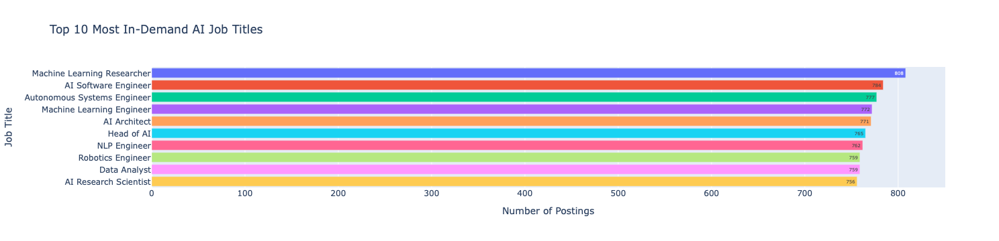

In [100]:
#PLOT: What are the most in-demand job titles in the ai job market currently?

import plotly.express as px

#count job titles and reset index
job_title_counts = df['job_title'].value_counts().reset_index()
job_title_counts.columns = ['job_title', 'postings']

#plot the top 10
fig = px.bar(  #set as bar plot
    job_title_counts.head(10),  #top 10 most common roles
    x='postings',  #xaxis
    y='job_title',  #yaxis
    orientation='h',  #set horizontally
    color='job_title',  #color by job title
    text='postings',  #include number of postings in hover data
    title='Top 10 Most In-Demand AI Job Titles'  #set title
)

#format the chart
fig.update_layout(
    yaxis_title='Job Title',  #label y axis
    xaxis_title='Number of Postings',  #label x axis
    showlegend=False,  #no legend
    height=500

)

fig.show()

In [53]:
#What are the the max, min, median, and mean of salary by country?

print("Salary Statistics by Country:")

#group by country, return max, min, median, mean of salary, round to 2 decimal places
#observed = True to bypass error

salary_by_country = df.groupby('company_location', observed = True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2)

salary_by_country



Salary Statistics by Country:


,max,min,median,mean
company_location,,,,
Australia,292604,46731,103205.5,118238.89
Austria,206978,32542,74005.0,85174.53
Canada,271344,44119,100392.0,114253.31
China,204450,33013,76543.0,84899.00
Denmark,379418,59596,147504.5,165652.25
Finland,206490,32977,80143.0,88726.24
France,275694,43226,101908.0,114411.36
Germany,291446,46230,106923.0,121810.14
India,203402,32519,76035.0,84236.05


In [57]:
#Which 5 countries have the highest max, min, median salary stats?

#group by country and calculate salary stats
top_5_country_salary_stats = df.groupby('company_location', observed=True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2)

#sort and display top 5 countries for each metric

print("Top 5 Countries by Max Salary:\n")
print(top_5_country_salary_stats.sort_values(by='max', ascending=False).head(5))

print("\nTop 5 Countries by Mean Salary:\n")
print(top_5_country_salary_stats.sort_values(by='mean', ascending=False).head(5))

print("\nTop 5 Countries by Median Salary:\n")
print(top_5_country_salary_stats.sort_values(by='median', ascending=False).head(5))

print("\nTop 5 Countries by Min Salary:\n")
print(top_5_country_salary_stats.sort_values(by='min', ascending=False).head(5))


Top 5 Countries by Max Salary:

                     max    min    median       mean
company_location                                    
Switzerland       399095  65416  152901.0  170639.09
Denmark           379418  59596  147504.5  165652.25
Norway            362503  59644  142386.0  159490.53
United States     344471  54512  128606.0  146833.05
United Kingdom    310470  48743  115281.0  128720.19

Top 5 Countries by Mean Salary:

                     max    min    median       mean
company_location                                    
Switzerland       399095  65416  152901.0  170639.09
Denmark           379418  59596  147504.5  165652.25
Norway            362503  59644  142386.0  159490.53
United States     344471  54512  128606.0  146833.05
United Kingdom    310470  48743  115281.0  128720.19

Top 5 Countries by Median Salary:

                     max    min    median       mean
company_location                                    
Switzerland       399095  65416  152901.0  170639.

In [36]:
#Which 5 countries have the lowest max, min, median, mean salary stats?

#group by country and calculate salary stats
bottom_salary_stats = df.groupby('company_location', observed=True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2)

#sort and display top 5 countries for each metric

print("Bottom 5 Countries by Max Salary:\n")
print(bottom_salary_stats.sort_values(by='max', ascending=True).head(5))

print("\nBottom 5 Countries by Mean Salary:\n")
print(bottom_salary_stats.sort_values(by='mean', ascending=True).head(5))

print("\nBotoom 5 Countries by Median Salary:\n")
print(bottom_salary_stats.sort_values(by='median', ascending=True).head(5))

print("\nBottom 5 Countries by Min Salary:\n")
print(bottom_salary_stats.sort_values(by='min', ascending=True).head(5))



Bottom 5 Countries by Max Salary:

                     max    min   median      mean
company_location                                  
India             203402  32519  76035.0  84236.05
Ireland           203440  32692  73939.5  86061.04
China             204450  33013  76543.0  84899.00
Israel            205530  32587  78614.0  86989.63
South Korea       205682  32666  76244.5  85842.70

Bottom 5 Countries by Mean Salary:

                     max    min   median      mean
company_location                                  
India             203402  32519  76035.0  84236.05
China             204450  33013  76543.0  84899.00
Austria           206978  32542  74005.0  85174.53
South Korea       205682  32666  76244.5  85842.70
Ireland           203440  32692  73939.5  86061.04

Botoom 5 Countries by Median Salary:

                     max    min   median      mean
company_location                                  
Ireland           203440  32692  73939.5  86061.04
Austria           2069

In [63]:
#What are the the max, min, median, and mean of benefits score by country?

print("Benefits Score Statistics by Country:")

#group by country, return max, min, median, mean of salary, round to 2 decimal places
#observed = True to bypass error

benefits_score_by_country = df.groupby('company_location', observed = True)['benefits_score'].agg(['max', 'min', 'median', 'mean']).round(2)

benefits_score_by_country

Benefits Score Statistics by Country:


,max,min,median,mean
company_location,,,,
Australia,10.0,5.0,7.60,7.52
Austria,10.0,5.0,7.50,7.52
Canada,10.0,5.0,7.60,7.57
China,10.0,5.0,7.60,7.52
Denmark,10.0,5.0,7.60,7.60
Finland,10.0,5.0,7.60,7.54
France,10.0,5.0,7.60,7.51
Germany,10.0,5.0,7.50,7.49
India,10.0,5.0,7.65,7.57


In [69]:
#Which 5 countries have the highest average benefits scores?

#group by company location, calculate avg benefits score, round 2 decimal places

top_benefits_stats = df.groupby('company_location', observed = True)['benefits_score'].agg(['mean']).round(2)

print("\nTop 5 Countries by Average Benefits Score:\n")

#sort descending, limit as needed
top_benefits_stats.sort_values(by='mean', ascending=False).head(5)


Top 5 Countries by Average Benefits Score:



,mean
company_location,
Denmark,7.60
United States,7.57
Canada,7.57
India,7.57
Finland,7.54


In [71]:
#Which 5 countries have the lowest average benefits scores?

#group by company location, calculate average benefits score, round 2 decimal places

bottom_benefits_stats = df.groupby('company_location', observed = True)['benefits_score'].agg(['mean']).round(2)

print("\nBottom 5 Countries by Average Benefits Score:\n")

bottom_benefits_stats.sort_values(by='mean', ascending=True).head(5)


Bottom 5 Countries by Average Benefits Score:



,mean
company_location,
Ireland,7.39
South Korea,7.42
United Kingdom,7.44
Switzerland,7.45
Japan,7.47


In [90]:
#Which country offers the role with the max salary?

print("Country with the Highest Paying Role:\n")

#access the salary_usd column, find the index (row label) of the max salary in the column
#use .loc to return the company location, job title, employment type, remote type, and salary at that row

max_salary_country = df.loc[df['salary_usd'].idxmax(), ['company_location', 'job_title', 'employment_type', 'remote_type', 'salary_usd']]

print(max_salary_country)




Country with the Highest Paying Role:

company_location                    Switzerland
job_title           Machine Learning Researcher
employment_type                              PT
remote_type                             On-Site
salary_usd                               399095
Name: 9891, dtype: object


In [94]:
#Which country offers the role with the lowest salary?

print("Country with the Lowest Paying Role:\n")

#access the salary_usd column, find the index (row label) of the min salary in the column
#use .loc to return the company location, job title, employment type, remote type, and salary at that row

min_salary_country = df.loc[df['salary_usd'].idxmin(), ['company_location', 'job_title', 'employment_type', 'remote_type', 'salary_usd']]

print(min_salary_country)

Country with the Lowest Paying Role:

company_location                       India
job_title           Computer Vision Engineer
employment_type                           FT
remote_type                           Remote
salary_usd                             32519
Name: 9549, dtype: object


In [50]:
#How many jobs is each country posting monthly?

#extract month from posting_date and create column job_posting_month

df['job_posting_month'] = df['posting_date'].dt.to_period('M')

#group by country and time period, count job posts, flatten into df and name the count column job_count

monthly_postings_by_country = df.groupby(['company_location', 'job_posting_month']).size().reset_index(name = 'job_count')

#check that columns are correct

print(monthly_postings_by_country.columns)

#check results

print("Monthly Postings by Country:")

monthly_postings_by_country

Index(['company_location', 'job_posting_month', 'job_count'], dtype='object')

Monthly Postings by Country:


,company_location,job_posting_month,job_count
0,Australia,2024-01,35
1,Australia,2024-02,45
2,Australia,2024-03,39
3,Australia,2024-04,53
4,Australia,2024-05,49
...,...,...,...
315,United States,2024-12,46
316,United States,2025-01,43
317,United States,2025-02,39
318,United States,2025-03,48


In [83]:
#Which 5 countries are seeing the fastest job posting growth?

#group by country and sum total job postings

total_monthly_postings_by_country = monthly_postings_by_country.groupby('company_location')['job_count'].sum()

top_5_countries = total_monthly_postings_by_country.sort_values(ascending = False).head(5)

print("Countries with the Most Monthly Job Postings:\n")
      
top_5_countries

Countries with the Most Monthly Job Postings:



company_location
Germany    814
Denmark    778
Canada     769
France     769
Austria    765
Name: job_count, dtype: int64

In [54]:
#Which 5 countries are seeing the slowest job posting growth?

#group by country and sum total job postings

total_monthly_postings_by_country = monthly_postings_by_country.groupby('company_location')['job_count'].sum()

bottom_5_countries = total_monthly_postings_by_country.sort_values(ascending = True).head(5)

print("Countries with the Fewest Monthly Job Postings:\n")

bottom_5_countries

Countries with the Fewest Monthly Job Postings:



company_location
Norway            721
South Korea       722
United States     724
United Kingdom    729
Netherlands       731
Name: job_count, dtype: int64

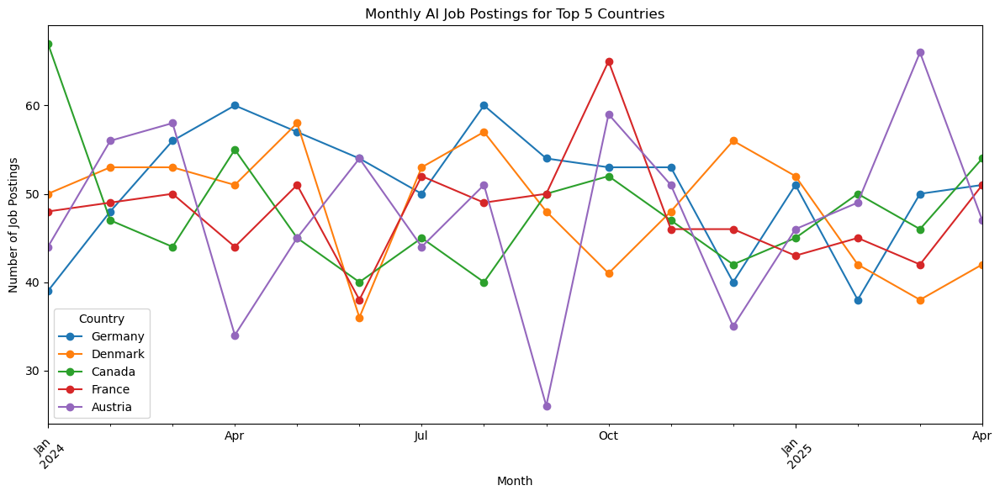

In [106]:
#PLOT: #Which countries are seeing the fastest job posting growth?

#find top 5 countries by total job count from query above

#pivot to get countries as columns and months as rows

pivot_monthly_postings = monthly_postings_by_country.pivot(
    index='job_posting_month',
    columns='company_location',
    values='job_count'
).fillna(0)

#get top 5 countries with highest total job posts

top_5_countries = pivot_monthly_postings.sum().sort_values(ascending=False).head(5).index

#filter the pivoted data to include only top 5 countries

top_5_postings = pivot_monthly_postings[top_5_countries]

#plot

import matplotlib.pyplot as plt

top_5_postings.plot(figsize=(12, 6), marker='o')
plt.title('Monthly AI Job Postings for Top 5 Countries')  #set title
plt.xlabel('Month') #label xaxis
plt.ylabel('Number of Job Postings') #label yaxis
plt.xticks(rotation=45) #rotate tick marks as needed to fit
plt.legend(title='Country')  #set legend
plt.tight_layout()
plt.show()

In [447]:
#How do monthly job postings compare across company continent?

#group by continent and return total number of job postings per month

monthly_postings_by_continent = df.groupby(['company_continent', 'job_posting_month']).size().reset_index(name = 'job_count')

#pivot to get countries as columns and months as rows for visiblity and plotting

pivot_postings_by_continent = monthly_postings_by_continent.pivot(
    index = 'job_posting_month',
    columns = 'company_continent',
    values = 'job_count'
).fillna(0)

print("Monthly Job Postings by Continent:\n")

pivot_postings_by_continent


Total Monthly Job Postings by Continent:



company_continent,Asia,Australia,Europe,North America
job_posting_month,,,,
2024-01,297,35,504,117
2024-02,283,45,505,94
2024-03,269,39,523,101
2024-04,315,53,511,106
2024-05,296,49,518,92
2024-06,293,50,511,84
2024-07,280,40,552,87
2024-08,279,44,563,72
2024-09,257,54,483,101


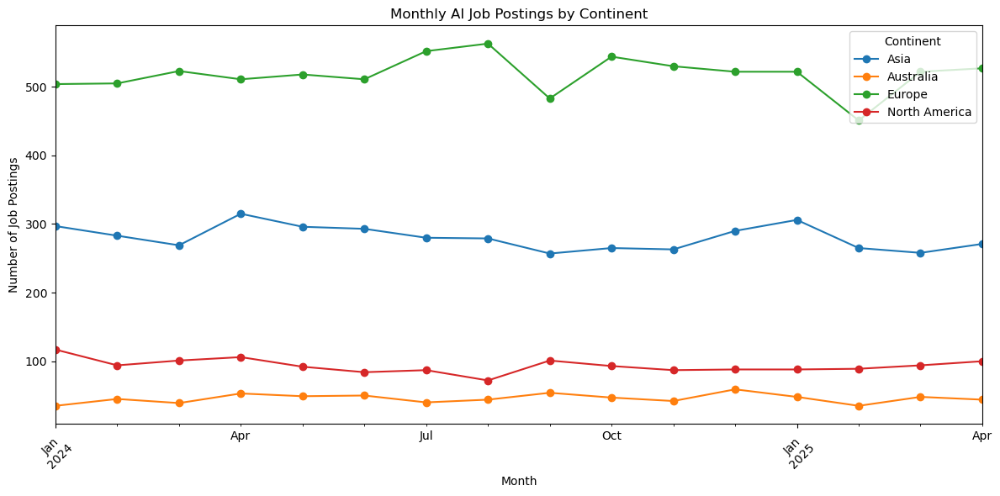

In [449]:
#PLOT: Monthly Job Postings Totals by Continent

#plot

import matplotlib.pyplot as plt

pivot_postings_by_continent.plot(figsize=(12, 6), marker='o')
plt.title('Monthly AI Job Postings by Continent')  #set title
plt.xlabel('Month')  #label xaxis
plt.ylabel('Number of Job Postings')  #label yaxis
plt.xticks(rotation=45)  #rotate tick marks as needed to fit
plt.legend(title='Continent')  #set legend
plt.tight_layout()
plt.show()

<br><br>

__3. Employment Type Analysis__

- Perform various analyses to explore trends by employment type, job title, remote type, industry:
  - What is the distribution of remote vs on-site roles per employment type?
  - What is the distribution of salaries across the dataset?
  - What is the distribution of benefits scores across the dataset?
  - What are the the max, min, median, and mean of salary by employment type?
  - What are the max, min, median, and mean of benefits score by employment type?
  - What are the the max, min, median, and mean of salary by remote type?
  - What are the the max, min, median, and mean of benefits score by remote type?
  - What are the the max, min, median, and mean of salary by industry? MOVE TO INDUSTRY?
  - What are the the max, min, median, and mean of salary by job title?
  - What are the the max, min, median, and mean of benefits score by job title?
    
<br>  

- Questions answered in SQL:
  - Which job types currently dominate the AI job market?
  - What is the distribution of remote vs on-site and hybrid roles per employment type? (Also explored below)
  - How are salary ranges distributed across the data? (also plotted below)



In [475]:
#What is the distribution of remote vs on-site roles per employment type?


#group by employment_type and remote_ratio, count job posts, flatten into df and name the count column job_count

job_remote_distribution = df.groupby(['employment_type', 'remote_ratio']).size().reset_index(name = 'job_count')

#create dictionary to map remote ratio to actual values

remote_map = {
    0: 'on-site',
    50: 'hybrid',
    100: 'remote'
}

#connect remote_map to job_remote_distribution df and create column remote_type

job_remote_distribution['remote_type'] = job_remote_distribution['remote_ratio'].map(remote_map)

#calculate total jobs per employment type by grouping by employment type and finding sum of job count, create column total_jobs

job_remote_distribution['total_jobs'] = job_remote_distribution.groupby('employment_type')['job_count'].transform('sum')

#calculate percentage of remote_type within each employment_type, create column percent_of_remote_type

job_remote_distribution['percent_of_remote_type'] = (job_remote_distribution['job_count']/job_remote_distribution['total_jobs']) * 100


job_remote_distribution





,employment_type,remote_ratio,job_count,remote_type,total_jobs,percent_of_remote_type
0,CT,0,1216,on-site,3721,32.679387
1,CT,50,1241,hybrid,3721,33.351250
2,CT,100,1264,remote,3721,33.969363
3,FL,0,1298,on-site,3758,34.539649
4,FL,50,1228,hybrid,3758,32.676956
5,FL,100,1232,remote,3758,32.783395
6,FT,0,1303,on-site,3812,34.181532
7,FT,50,1265,hybrid,3812,33.184680
8,FT,100,1244,remote,3812,32.633788
9,PT,0,1258,on-site,3709,33.917498


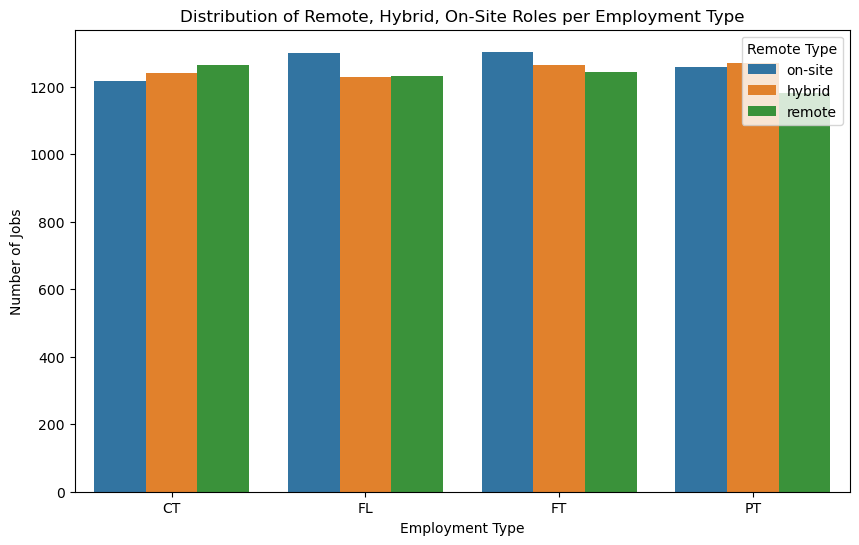

In [110]:
#PLOT: What is the distribution of remote vs on-site roles by employment type? (Version 1)

import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))  #set figure size
sns.barplot(
    data = job_remote_distribution,  #refer to job_remote_distribution df
     x = 'employment_type',  #set x values as employment type
     y = 'job_count',  #set y values as count of jobs
     hue = 'remote_type'  #color by remote type
)
plt.title('Distribution of Remote, Hybrid, On-Site Roles per Employment Type')  #set title
plt.xlabel('Employment Type')  #label x axis
plt.ylabel('Number of Jobs')  #label y axis
plt.legend(title = 'Remote Type')  #add title to legend
plt.show()

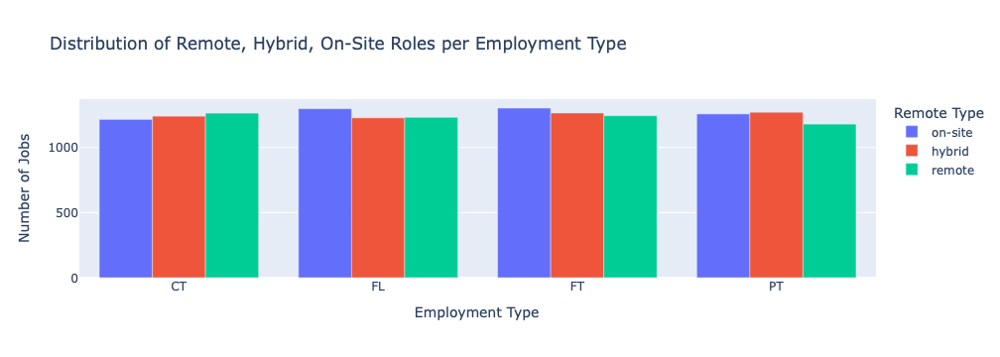

In [112]:
#PLOT: What is the distribution of remote vs on-site roles by employment type?  (Version 2)

#plot the distribution of remote_type count by employment_type in plotly to compare with plot above

import plotly.express as px

fig = px.bar(  #bar
    job_remote_distribution,
    x='employment_type',  #set x values as employment type
    y='job_count',  #set y values as count of jobs
    color='remote_type',  #color by remote type
    barmode='group',  #make bars grouped instead of stacked
    title='Distribution of Remote, Hybrid, On-Site Roles per Employment Type',  #set title
    labels={
        'employment_type': 'Employment Type', #set labels on hover data
        'remote_type': 'Remote Type',
        'job_count': 'Number of Jobs'
    },
    hover_data=['remote_type', 'job_count', 'employment_type']  #add hover data for granularity and visibility
)

fig.show()


#likely to use this one, it looks better

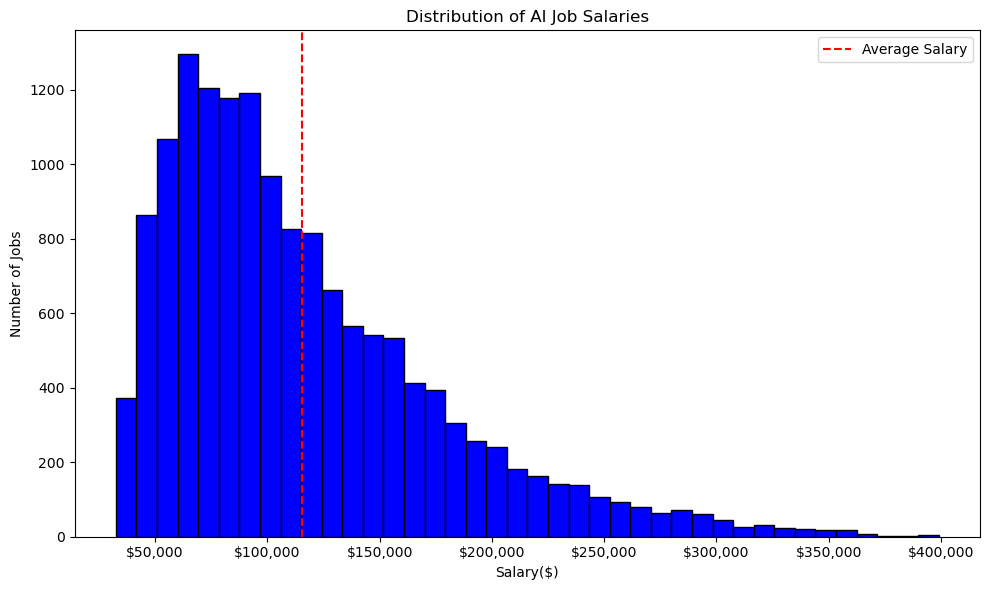

In [296]:
#How are salaries distributed across the dataset? (also done in SQL to see "ranges")

#plot histogram

import matplotlib.pyplot as plt
import matplotlib.ticker as mtick

plt.figure(figsize=(10,6))
plt.hist(df['salary_usd'], bins = 40, color = 'blue', edgecolor = 'black')  #set as histogram
avg_salary = df['salary_usd'].mean() #add vertical line for average salary
plt.axvline(avg_salary, color = 'red', linestyle = 'dashed', linewidth = 1.5, label = 'Average Salary') #add average line
plt.title('Distribution of AI Job Salaries') #set title
plt.xlabel('Salary($)') #label xaxis
plt.gca().xaxis.set_major_formatter(mtick.StrMethodFormatter('${x:,.0f}')) #format as currency
plt.ylabel('Number of Jobs') #label yaxis
plt.legend() #set legend
plt.tight_layout()
plt.show()



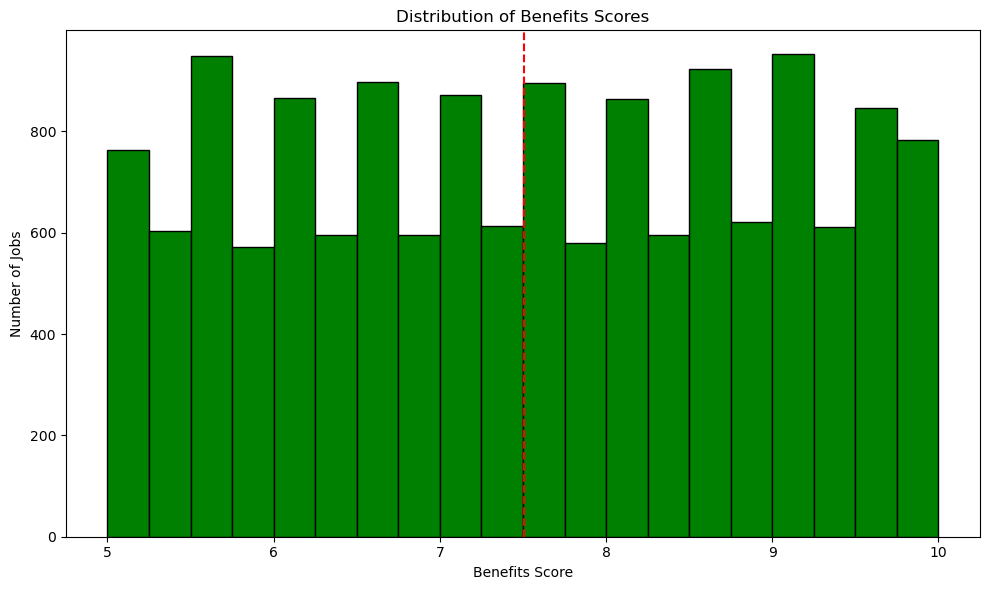

In [335]:
#How are benefits scores distributed across the dataset?

import matplotlib.pyplot as plt

plt.figure(figsize=(10,6))
plt.hist(df['benefits_score'], bins=20, color ='green', edgecolor = 'black')  #set as histogram
plt.title('Distribution of Benefits Scores') #set title
plt.xlabel('Benefits Score') #label xaxis
plt.ylabel('Number of Jobs')  #label yaxis
avg_benefits_score = df['benefits_score'].mean() #add vertical line for average benefits score
plt.axvline(avg_benefits_score, color = 'red', linestyle = 'dashed', linewidth = 1.5, label = 'Average Benefits Score') #add average line
plt.tight_layout()
plt.show()

In [453]:
#What are the the max, min, median, and mean of salary by employment type?

print("Salary Statistics by Employment Type:\n")

#group by employment type and return max, min, median, mean of salary, round to 2 decimal places
#observed = True to bypass error

df.groupby('employment_type', observed = True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2)

Salary Statistics by Employment Type:



,max,min,median,mean
employment_type,,,,
CT,398084,33117,100445.0,115918.92
FL,379418,32587,99603.5,114967.65
FT,390292,32519,100421.5,116338.14
PT,399095,32542,98201.0,114146.88


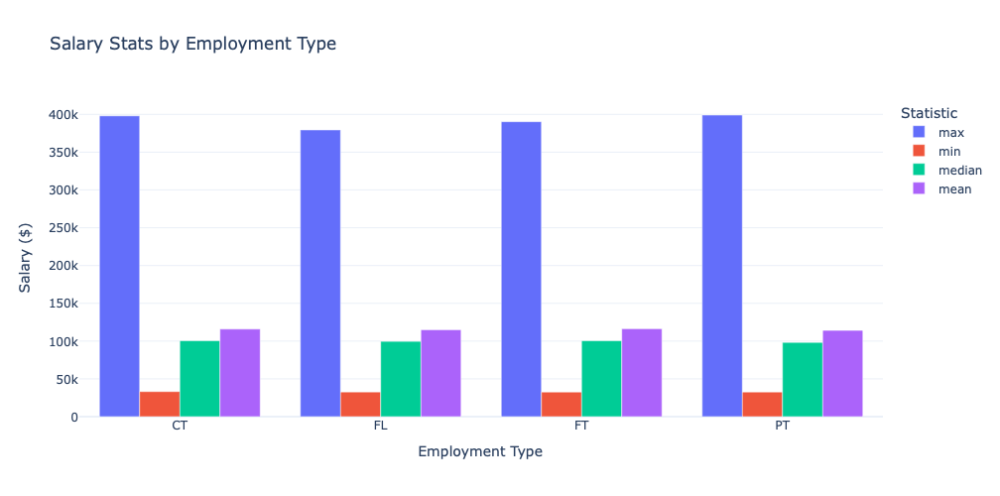

In [525]:
import plotly.express as px

#group and calculate salary stats
salary_by_employment = df.groupby('employment_type', observed=True)['salary_usd']\
    .agg(['max', 'min', 'median', 'mean']).round(2).reset_index()

#"melt" the dataframe into long format
salary_by_employment_melted = salary_by_employment.melt(
    id_vars='employment_type',
    var_name='stat',
    value_name='salary_usd'
)

#add a text column for hover labels
salary_by_employment_melted['text'] = (
    salary_by_employment_melted['stat'].str.title() + ': $' + 
    salary_by_employment_melted['salary_usd'].round(0).apply(lambda x: f"{int(x):,}")  #format as currency
)

#create the bar chart
fig = px.bar(
    salary_by_employment_melted,
    x='employment_type',  #set x values
    y='salary_usd', #set y values
    color='stat', #color by statistic
    barmode='group',  #group stat values with each employment type respectively
    text='text',
    title='Salary Stats by Employment Type',  #set title
    labels={'salary_usd': 'Salary ($)', 'employment_type': 'Employment Type', 'stat': 'Statistic'}  #set labels
   
)

#update hover and layout
#this was tricky, had to source stackoverflow
#%{x} shows the x-axis value of the bar
#<br> line break
#%{text} shows the custom text assigned to each bar
#<extra>/</extra> removes the trace name from the hover box

fig.update_traces(
    hovertemplate='%{x}<br>%{text}<extra></extra>', 
)

fig.update_layout(
    height=500,
    width=800,
    template='plotly_white'
)

fig.show()

In [517]:
#What are the the max, min, median, and mean of salary by remote type?

print("Salary Statistics by Remote Type:\n")

#create a dictionary to map remote ratio to remote type (0 = on-site, 50 = hybrid, 100 = remote)

df['remote_type'] = df['remote_ratio'].map({
    0: 'On-Site',
    50: 'Hybrid',
    100: 'Remote'
})

#group by remote ratio and remote type, return max, min, median, mean of salary, round to 2 decimal places
#observed = True to bypass error

df.groupby(['remote_ratio', 'remote_type'], observed = True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2)

Salary Statistics by Remote Type:



,,max,min,median,mean
remote_ratio,remote_type,,,,
0,On-Site,399095,32666,98817.0,114140.23
50,Hybrid,394917,32542,99295.0,115776.81
100,Remote,398084,32519,100614.0,116160.55


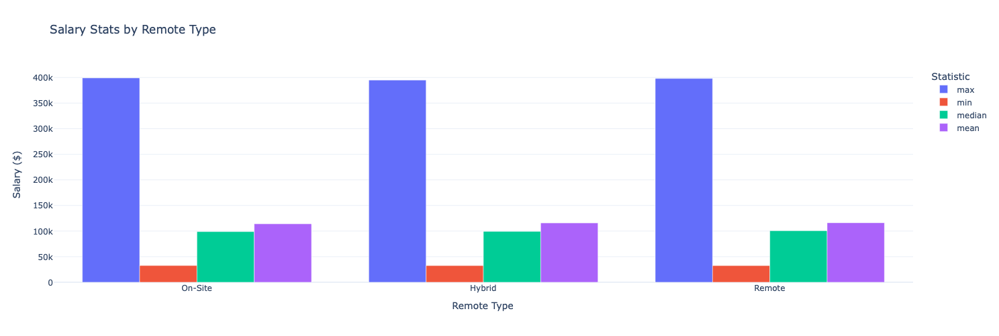

In [515]:
#PLOT: What are the max, min, median, and mean of salary by remote type?

import plotly.express as px

#add a text column for custom hover labels
salary_by_remote_melted['text'] = (
    salary_by_remote_melted['stat'].str.title() + ': $' + 
    salary_by_remote_melted['salary_usd'].round(0).apply(lambda x: f"{int(x):,}")  #format as currency
)

#create the bar chart
fig = px.bar(
    salary_by_remote_melted,
    x='remote_type',  #x axis
    y='salary_usd',  #y axis
    color='stat',  #color by stat
    barmode='group',  #group stats together by respective remote type
    text='text',
    title='Salary Stats by Remote Type',  #set title
    labels={'salary_usd': 'Salary ($)', 'remote_type': 'Remote Type', 'stat': 'Statistic'}  #set labels
)

#update hover to show the stat name and salary cleanly
#update hover and layout
#%{x} shows the x-axis value of the bar
#<br> line break
#%{text} shows the custom text assigned to each bar
#<extra>/</extra> removes the trace name from the hover box
fig.update_traces(
    hovertemplate='%{x}<br>%{text}<extra></extra>',
    textposition='none'
)

#improve layout
fig.update_layout(
    height=500,
    width=800,
    template='plotly_white'
)

fig.show()

In [124]:
#What are the the max, min, median, and mean of salary by job title?

print("Salary Statistics by Job Title:")

#group by job title, return max, min, median, mean of salary, round to 2 decimal places

df.groupby('job_title')['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2)

Salary Statistics by Job Title:


,max,min,median,mean
job_title,,,,
AI Architect,398084,33220,99888.0,117436.51
AI Consultant,325757,33959,101471.0,113671.87
AI Product Manager,381575,33770,99434.0,114680.91
AI Research Scientist,394917,33092,100990.0,117897.93
AI Software Engineer,379418,33013,97701.5,114273.20
AI Specialist,390292,34174,103626.5,120570.76
Autonomous Systems Engineer,364585,32790,97415.0,111396.56
Computer Vision Engineer,366957,32519,96679.0,113472.71
Data Analyst,361541,32542,96074.0,111321.18


In [451]:
#What are the max, min, median, and mean of benefits score by employment type?

print("Benefits Score Statistics by Employment Type:\n")

#group by employment type and return max, min, median, mean of benefits score, round to 2 decimal places
#observed = True to bypass error

df.groupby('employment_type', observed = True)['benefits_score'].agg(['max', 'min', 'median', 'mean']).round(2)

Benefits Score Statistics by Employment Type:



,max,min,median,mean
employment_type,,,,
CT,10.0,5.0,7.5,7.47
FL,10.0,5.0,7.6,7.52
FT,10.0,5.0,7.5,7.50
PT,10.0,5.0,7.5,7.53


In [118]:
#What are the the max, min, median, and mean of benefits score by remote type?

print("Benefits Score Statistics by Remote Type:")

#group by remote ratio and remote type, return max, min, median, mean of benefits score, round to 2 decimal places
#observed = True to bypass error

df.groupby(['remote_ratio', 'remote_type'], observed = True)['benefits_score'].agg(['max', 'min', 'median', 'mean']).round(2)


Benefits Score Statistics by Remote Type:


,,max,min,median,mean
remote_ratio,remote_type,,,,
0,On-Site,10.0,5.0,7.5,7.51
50,Hybrid,10.0,5.0,7.5,7.49
100,Remote,10.0,5.0,7.6,7.52


In [122]:
#What are the the max, min, median, and mean of benefits score by industry?

print("Benefits Score Statistics by Industry:")

#group by industry, return max, min, median, mean of benefits score, round to 2 decimal places

df.groupby('industry', observed = True)['benefits_score'].agg(['max', 'min', 'median', 'mean']).round(2)

Benefits Score Statistics by Industry:


,max,min,median,mean
industry,,,,
Automotive,10.0,5.0,7.4,7.42
Consulting,10.0,5.0,7.4,7.44
Education,10.0,5.0,7.4,7.47
Energy,10.0,5.0,7.4,7.43
Finance,10.0,5.0,7.5,7.52
Gaming,10.0,5.0,7.5,7.47
Government,10.0,5.0,7.7,7.57
Healthcare,10.0,5.0,7.5,7.52
Manufacturing,10.0,5.0,7.5,7.47


In [126]:
#What are the the max, min, median, and mean of benefits score by job title?

print("Benefits Score Statistics by Job Title:")

#group by job title, return max, min, median, mean of benefits score, round to 2 decimal places

df.groupby('job_title', observed = True)['benefits_score'].agg(['max', 'min', 'median', 'mean']).round(2)

Benefits Score Statistics by Job Title:


,max,min,median,mean
job_title,,,,
AI Architect,10.0,5.0,7.40,7.46
AI Consultant,10.0,5.0,7.40,7.45
AI Product Manager,10.0,5.0,7.40,7.50
AI Research Scientist,10.0,5.0,7.40,7.45
AI Software Engineer,10.0,5.0,7.50,7.51
AI Specialist,10.0,5.0,7.60,7.55
Autonomous Systems Engineer,10.0,5.0,7.50,7.50
Computer Vision Engineer,10.0,5.0,7.50,7.52
Data Analyst,10.0,5.0,7.60,7.59


<br><br>

__4. Skills, Education, & Experience Analysis__

- Peform various analyses to explore trends based on skills, education, and experience levels:
  - What are the max, min, median, and mean salaries per years experience level?
  - What are the max, min, median, and mean benefits scores per years experience level?
  - What are the max, min, median, and mean salaries per education required level?
  - What are the max, min, median, and mean benefits scores per education required level?
  - What are the most in-demand required skills in the AI job market?
  - What are the average salaries by skill?
  - Which technical skills are commonly requested together?


In [77]:
#How many jobs are posted for each experience level?

print("Number of Job Postings by Experience Level:\n")

#group by experience level, return total count

experience_counts = df['experience_level'].value_counts()

experience_counts

Number of Job Postings by Experience Level:



experience_level
MI    3781
EX    3760
SE    3741
EN    3718
Name: count, dtype: int64

In [129]:
#What are the max, min, median, and mean salaries per experience level?

print("Salary Statistics by Experience Level:")

#group by experience level, return max, min, median, mean of salary, round to 2 decimal places

df.groupby('experience_level', observed = True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2)

Salary Statistics by Experience Level:


,max,min,median,mean
experience_level,,,,
EN,131006,32519,60373.5,63133.38
EX,399095,86536,177512.0,187723.65
MI,177470,45900,84641.0,87955.47
SE,247271,64824,116907.0,122187.66


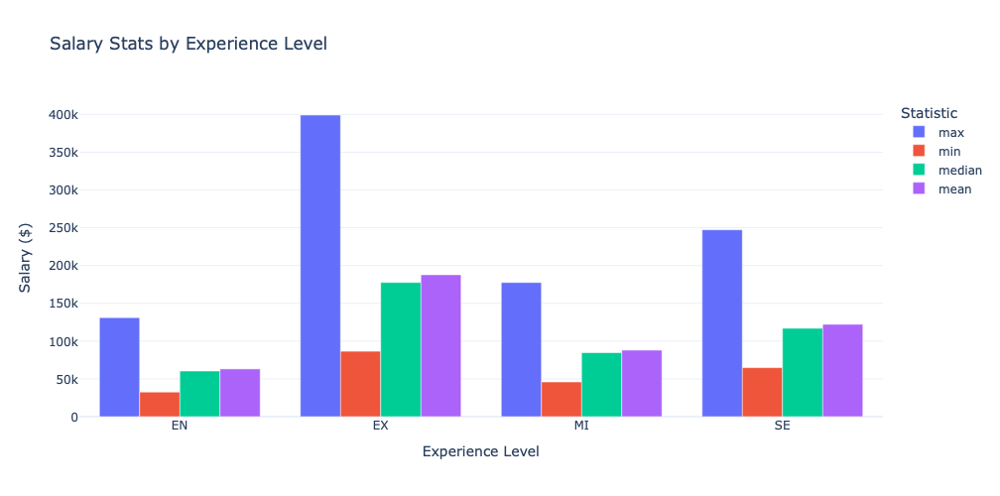

In [529]:
#PLOT: What are the max, min, median, and mean salaries per experience level?

import plotly.express as px

#group by experience level and calculate salary stats
salary_by_experience = df.groupby('experience_level', observed=True)['salary_usd']\
    .agg(['max', 'min', 'median', 'mean']).round(2).reset_index()

#melt to long format for easier plotting
salary_by_experience_melted = salary_by_experience.melt(
    id_vars='experience_level',
    var_name='stat',
    value_name='salary_usd'
)

#add formatted text column for hover info
salary_by_experience_melted['text'] = (
    salary_by_experience_melted['stat'].str.title() + ': $' +
    salary_by_experience_melted['salary_usd'].round(0).apply(lambda x: f"{int(x):,}")  #format as currency
)

#create grouped bar chart
fig = px.bar(
    salary_by_experience_melted,
    x='experience_level',  #x axis
    y='salary_usd', #y axis
    color='stat',  #color by statistic
    barmode='group',  #group stats by resepctive experience level
    text='text',
    title='Salary Stats by Experience Level',
    labels={'salary_usd': 'Salary ($)', 'experience_level': 'Experience Level', 'stat': 'Statistic'},  #set labels
)

#update hover and layout
#update hover and layout
#%{x} shows the x-axis value of the bar
#<br> line break
#%{text} shows the custom text assigned to each bar
#<extra>/</extra> removes the trace name from the hover box

fig.update_traces(
    hovertemplate='%{x}<br>%{text}<extra></extra>',
    textposition='none'
)

fig.update_layout(
    height=500,
    width=800,
    template='plotly_white'
)

fig.show()

In [131]:
#What are the max, min, median, and mean benefits scores per years experience level?

print("Benefits Score Statistics by Experience Level:")

#group by experience level, return max, min, median, mean of benefits score, round to 2 decimal places

df.groupby('experience_level', observed = True)['benefits_score'].agg(['max', 'min', 'median', 'mean']).round(2)

Benefits Score Statistics by Experience Level:


,max,min,median,mean
experience_level,,,,
EN,10.0,5.0,7.5,7.52
EX,10.0,5.0,7.5,7.50
MI,10.0,5.0,7.6,7.52
SE,10.0,5.0,7.5,7.48


In [133]:
#What are the max, min, median, and mean salaries per education required level?

print("Salary Statistics by Education Level:")

#group by education required level, return max, min, median, mean of salary, round to 2 decimal places

df.groupby('education_required', observed = True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2)



Salary Statistics by Education Level:


,max,min,median,mean
education_required,,,,
Associate,398084,32977,99139.0,114605.71
Bachelor,379418,32542,99087.0,115861.63
Master,399095,32519,102553.5,117171.82
PhD,364585,32790,97171.5,113728.17


In [533]:
#PLOT: What are the max, min, median, and mean salaries per education level required?

import plotly.express as px

#group by education level and calculate salary stats
salary_by_education = df.groupby('education_required', observed=True)['salary_usd']\
    .agg(['max', 'min', 'median', 'mean']).round(2).reset_index()

#melt to long format for easier plotting
salary_by_education_melted = salary_by_education.melt(
    id_vars='education_required',
    var_name='stat',
    value_name='salary_usd'
)

#add formatted text column for hover info
salary_by_education_melted['text'] = (
    salary_by_education_melted['stat'].str.title() + ': $' +
    salary_by_education_melted['salary_usd'].round(0).apply(lambda x: f"{int(x):,}")  #set as currency
)

#create grouped bar chart
fig = px.bar(
    salary_by_education_melted,
    x='education_required', #x axis
    y='salary_usd', #y axis
    color='stat', #color by statistic
    barmode='group', #group stat by respective education level
    text='text',
    title='Salary Stats by Education Level',
    labels={'salary_usd': 'Salary ($)', 'education_required': 'Education Level', 'stat': 'Statistic'},  #set labels
)

#update hover and layout
#update hover and layout
#update hover and layout
#%{x} shows the x-axis value of the bar
#<br> line break
#%{text} shows the custom text assigned to each bar
#<extra>/</extra> removes the trace name from the hover box

fig.update_traces(
    hovertemplate='%{x}<br>%{text}<extra></extra>',
    textposition='none'
)

fig.update_layout(
    height=500,
    width=800,
    template='plotly_white'
)

fig.show()

In [135]:
#What are the max, min, median, and mean benefits scores per education required level?

print("Benefits Score Statistics by Education Level:")

#group by education required level, return max, min, median, mean of benefits scores, round to 2 decimal places

df.groupby('education_required', observed = True)['benefits_score'].agg(['max', 'min', 'median', 'mean']).round(2)

Benefits Score Statistics by Education Level:


,max,min,median,mean
education_required,,,,
Associate,10.0,5.0,7.5,7.52
Bachelor,10.0,5.0,7.5,7.54
Master,10.0,5.0,7.5,7.49
PhD,10.0,5.0,7.5,7.48


In [102]:
#What are the most in-demand required skills in the AI job market?

#combine all required skills into a single string
#concatenate all the strings in that column into one string and separate them with commas
#convert entire combined string to lowercase

all_skills = df['required_skills'].dropna().str.cat(sep=',').lower()

#split all_skills and create a list of individual skills
#split the long string into a list of individual words by comma, remove leading/trailing whitespaces
#loop through every skill and apply strip to each
skills_list = [skill.strip() for skill in all_skills.split(',')]

#use counter to count the frequency of items in skills_list
from collections import Counter
skill_counts = Counter(skills_list)

#convert to a dataframe
top_skills = pd.DataFrame(skill_counts.items(), columns=['required_skills', 'number_of_jobs_requesting_skill']).sort_values(by='number_of_jobs_requesting_skill', ascending=False)

#reset index
top_skills.reset_index(drop = True, inplace = True)

print("Most Requested Skills by Frequency:\n")

#display all
top_skills


Most Requested Skills by Frequency:



,required_skills,number_of_jobs_requesting_skill
0,python,4450
1,sql,3407
2,tensorflow,3022
3,kubernetes,3009
4,scala,2794
5,pytorch,2777
6,linux,2705
7,git,2631
8,java,2578
9,gcp,2442


In [139]:
#What are the most in-demand required skills in the AI job market? (continued)

#return top 10 requested skills

top_skills.head(10)

,required_skills,number_of_jobs_requesting_skill
0,python,4450
1,sql,3407
2,tensorflow,3022
3,kubernetes,3009
4,scala,2794
5,pytorch,2777
6,linux,2705
7,git,2631
8,java,2578
9,gcp,2442


In [143]:
#Find salary counts

print('Salary Counts:')

#return count of each salary occurrence

df['salary_usd'].value_counts().head(20)

Salary Counts:


salary_usd
67253     4
51000     4
65948     3
67383     3
62707     3
85416     3
66556     3
79415     3
147573    3
77542     3
61033     3
149281    3
73393     3
89567     3
78409     3
115976    3
87707     3
57458     3
170717    3
85131     3
Name: count, dtype: int64

In [145]:
#Find overall max salary

print("Max Salary Overall:")

#return overall max salary

df['salary_usd'].max()


Max Salary Overall:


399095

In [147]:
#Find overall min salary

print("Min Salary Overall:")

#return overall min salary

df['salary_usd'].min()

Min Salary Overall:


32519

In [149]:
#Find overall average salary

print("Average Salary Overall:")

#return overall avg salary

df['salary_usd'].mean().round(2)

Average Salary Overall:


115348.97

In [128]:
#What are the average salaries by skill?

#1. create a new list of skill-salary pairs
#2. aggregate salaries by skill
#3. calculate average salary per skill
#4. sort and view the top-paying skills

#drop rows with missing skills/salaries

df_skills = df[['required_skills', 'salary_usd']].dropna()

#create a list to store skill/salary pairs

skill_salary_pairs = []

#loop through each row and create skill/salary pairs

for _, row in df_skills.iterrows(): #goes row by row through df_skills (row contains a required_skills string and a salary)  #_ ignores index
    skills = [s.strip().lower() for s in row['required_skills'].split(',')] #take the comma separated string in required_skills, remove extra spaces, lowercase
    for skill in skills:  #loop through each skill in that list
        skill_salary_pairs.append((skill, row['salary_usd'])) #return a list of tuples (i.e. (python, 120000))

#turn the list into a dataframe

skill_salary_df = pd.DataFrame(skill_salary_pairs, columns = ['skill', 'salary_usd'])  #convert the list of tuples into a df with two columns

#group and find average salary per skill

avg_salary_by_skill = skill_salary_df.groupby('skill')['salary_usd'].mean().reset_index() #group same skills, return avg salary per skill, reset index so that skill is a column

#sort

avg_salary_by_skill = avg_salary_by_skill.sort_values(by = 'salary_usd', ascending = False)

print("Average Salary by Skill:\n")

avg_salary_by_skill

Average Salary by Skill:



,skill,salary_usd
4,deep learning,117242.074920
18,scala,117207.426271
5,docker,116751.924275
7,git,116659.985177
14,nlp,116217.931469
2,computer vision,115897.875219
6,gcp,115799.629402
8,hadoop,115749.505994
16,pytorch,115527.204537
3,data visualization,115464.426432


In [153]:
#Which technical skills are commonly requested together?


#import combinations to generate skill pairs
#import counter to count occurences

from itertools import combinations
from collections import Counter

#drop rows where 'required_skills' is missing

skills_series = df['required_skills'].dropna()

#clean and split the skills into lists
#for each row in 'required_skills', split the skills by commas
#convert each skill to lowercase and remove extra spaces
#use sorted() so that the skill order is consistent

skill_sets = [
    sorted([skill.strip().lower() for skill in skills.split(',') if skill.strip()])
    for skills in skills_series
]

#create an empty counter to track all skill pairs

pair_counter = Counter()

for skill_list in skill_sets:  #loop through each list of skills
    if len(skill_list) >= 2:  #only look at rows with 2 or more skills
        pairs = combinations(skill_list, 2) #create all possible 2-skill combinations
        pair_counter.update(pairs) #count each pair occurence

for pair, count in pair_counter.most_common(10):  #return the top 10 most frequently occuring skill pairs
    print(f"{pair[0]} & {pair[1]}: {count} times")

python & tensorflow: 1260 times
kubernetes & python: 731 times
pytorch & sql: 730 times
linux & python: 680 times
git & python: 673 times
gcp & python: 648 times
hadoop & python: 644 times
python & scala: 635 times
computer vision & python: 619 times
pytorch & tensorflow: 614 times


<br><br>

__5. Industry & Company Trends__

- Perform various analyses to explore trends based on industry and company:
  - What are the max, min, median, and mean of salary by industry?
  - Which industries are hiring the most AI professionals?
  - Which companies are hiring the most AI professionals?
  - Which roles in the AI industry are in highest demand?
  - Which industries offer the highest salaries?
  - Which companies offer the highest salaries?
  - Which industries offer the highest average benefits scores?
  - What are the average salaries by company size?
  - What are the average benefits scores by company size?


In [120]:
#What are the the max, min, median, and mean of salary by industry?

print("Salary Statistics by Industry:")

#group by industry, return max, min, median, mean of salary, round to 2 decimal places

df.groupby('industry', observed = True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2)

Salary Statistics by Industry:


,max,min,median,mean
industry,,,,
Automotive,398084,33220,97060.5,113987.24
Consulting,371087,33172,100983.5,117602.14
Education,346789,33280,101097.5,116026.80
Energy,381575,32519,99057.5,115188.44
Finance,350761,32542,101409.0,115323.40
Gaming,364635,33013,96073.0,112979.57
Government,343803,33804,101914.5,115694.32
Healthcare,379418,32907,101402.0,114433.88
Manufacturing,364585,33314,100007.0,116162.89


In [14]:
#PLOT: What are the max, min, median, and mean of salary by industry?

#group and calculate salary stats by industry
salary_by_industry = df.groupby('industry', observed=True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2).reset_index()

#melt the table so each stat becomes a row
salary_by_industry_melted = salary_by_industry.melt(id_vars='industry', var_name='stat', value_name='salary_usd')

#add a custom hover label
salary_by_industry_melted['text'] = (
    salary_by_industry_melted['stat'].str.title() + ': $' +
    salary_by_industry_melted['salary_usd'].round(0).apply(lambda x: f"{int(x):,}")
)


import plotly.express as px

fig = px.bar(
    salary_by_industry_melted,
    x='salary_usd',  #x axis
    y='industry',  #y axis
    color='stat',  #color by statistic
    orientation='h',  #set horizontally (stacked)
    text='text',
    title='Salary Stats by Industry', #set title
    labels={'salary_usd': 'Salary (USD)', 'industry': 'Industry', 'stat': 'Statistic'} #set labels
)



#update hover and layout
#%{x} shows the x-axis value of the bar
#<br> line break
#%{text} shows the custom text assigned to each bar
#<extra>/</extra> removes the trace name from the hover box

fig.update_traces(
    hovertemplate='%{y}<br>%{text}<extra></extra>',
    textposition='none'
)

fig.update_layout(
    height=800,
    width=900,
    template='plotly_white'
)

fig.show()

In [156]:
#Which industries are hiring the most AI professionals?

#group by industry, count number of postings, order descending

industry_counts = df['industry'].value_counts().sort_values(ascending = False)

print("Industries Hiring the Most AI Professionals:\n")

industry_counts  #limit as needed using .head()

Industries Hiring the Most AI Professionals:



industry
Retail                1063
Media                 1045
Automotive            1020
Consulting            1020
Technology            1011
Real Estate           1007
Government             998
Healthcare             997
Telecommunications     997
Transportation         997
Finance                984
Energy                 976
Gaming                 967
Manufacturing          962
Education              956
Name: count, dtype: int64

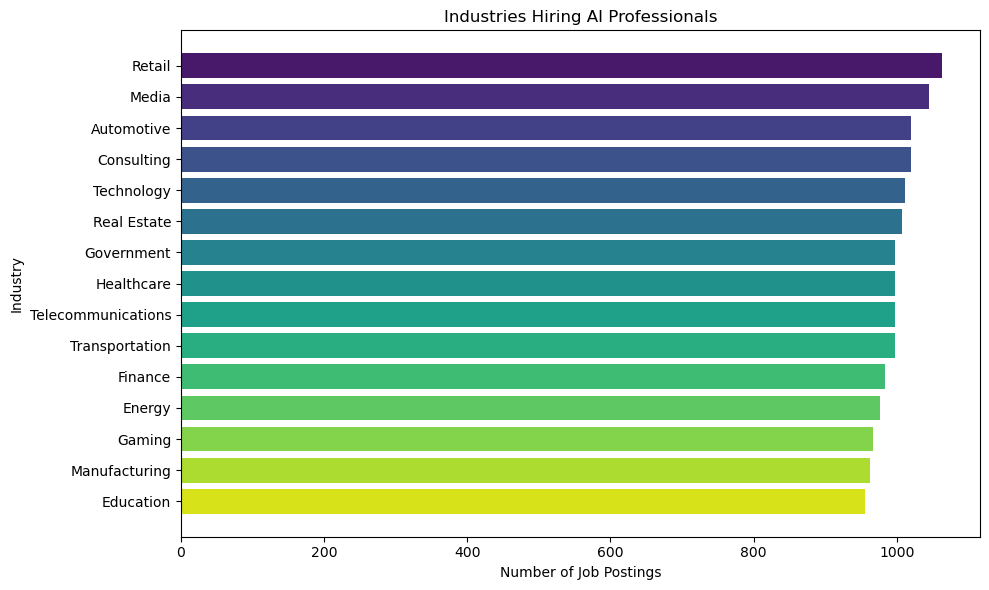

In [179]:
#PLOT: Which industries are hiring the most AI professionals?

import matplotlib.pyplot as plt

#limit to top 10 industries
top_industries = industry_counts

#plot--will limit this to top 5 when plotting in tableau

colors= sns.color_palette('viridis', len(top_industries))

plt.figure(figsize=(10, 6))
plt.barh(top_industries.index, top_industries.values, color = colors)  #set horizontal bar
plt.gca().invert_yaxis() #invert y-axis so the highest is on top
plt.title('Industries Hiring AI Professionals') #set title
plt.xlabel('Number of Job Postings')  #label x axis
plt.ylabel('Industry')  #label y axis
plt.tight_layout()
plt.show()

In [166]:
#Which companies are hiring the most AI professionals?

#group by company name, count number of postings, order descending

company_job_posting_counts = df['company_name'].value_counts().sort_values(ascending = False)

print ("Companies Hiring the Most AI Professionals:\n")

company_job_posting_counts #limit as needed using .head()  or .tail() to find lowest job postings count

Companies Hiring the Most AI Professionals:



company_name
TechCorp Inc                  980
Cognitive Computing           972
AI Innovations                964
Digital Transformation LLC    961
Future Systems                960
Quantum Computing Inc         960
Cloud AI Solutions            951
Predictive Systems            947
Smart Analytics               927
Advanced Robotics             925
Neural Networks Co            922
Machine Intelligence Group    922
Autonomous Tech               918
DataVision Ltd                909
DeepTech Ventures             897
Algorithmic Solutions         885
Name: count, dtype: int64

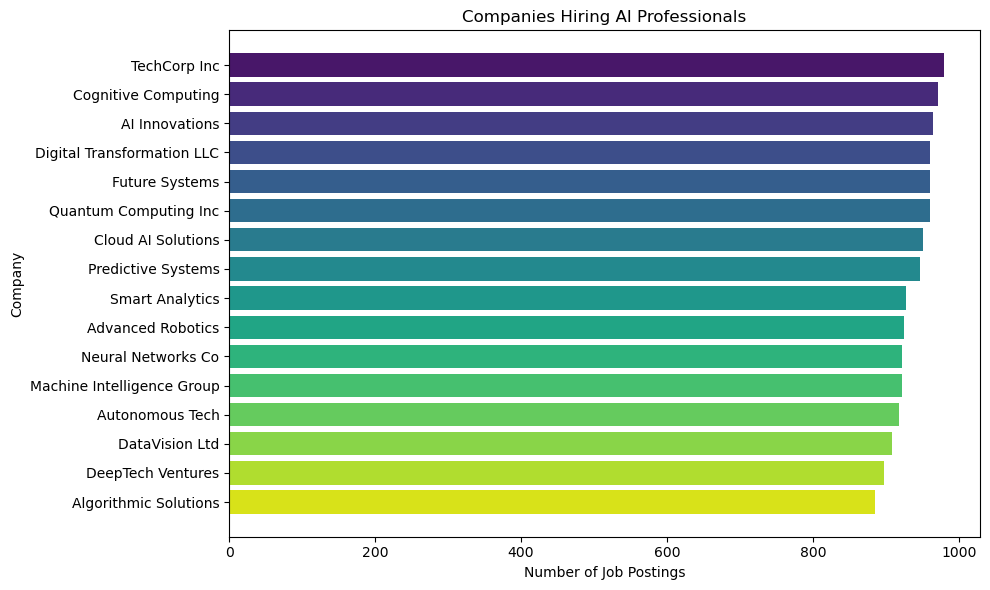

In [181]:
#PLOT: Which companies are hiring the most AI professionals?

import matplotlib.pyplot as plt

#limit to top 10 industries
top_companies = company_job_posting_counts

#plot--will limit this top 5 when plotting in tableau

colors= sns.color_palette('viridis', len(top_companies))

plt.figure(figsize=(10, 6))
plt.barh(top_companies.index, top_companies.values, color = colors) #set horizontal bar
plt.gca().invert_yaxis() #invert y-axis so the highest is on top
plt.title('Companies Hiring AI Professionals')  #set title
plt.xlabel('Number of Job Postings')  #label x axis
plt.ylabel('Company')  #label y axis
plt.tight_layout()
plt.show()

In [186]:
#Which roles in the AI industry are in highest demand?

#group by job title, count number of postings, order descending

high_demand_roles = df['job_title'].value_counts().sort_values(ascending = False)

print("Most In-Demand Roles in the AI Industry:\n")

high_demand_roles  #limit as needed using .head() or find lowest demand roles using .tail()

Most In-Demand Roles in the AI Industry:



job_title
Machine Learning Researcher    808
AI Software Engineer           784
Autonomous Systems Engineer    777
Machine Learning Engineer      772
AI Architect                   771
Head of AI                     765
NLP Engineer                   762
Robotics Engineer              759
Data Analyst                   759
AI Research Scientist          756
Data Engineer                  749
AI Product Manager             743
Research Scientist             742
Principal Data Scientist       734
AI Specialist                  728
ML Ops Engineer                725
Computer Vision Engineer       724
Data Scientist                 720
Deep Learning Engineer         718
AI Consultant                  704
Name: count, dtype: int64

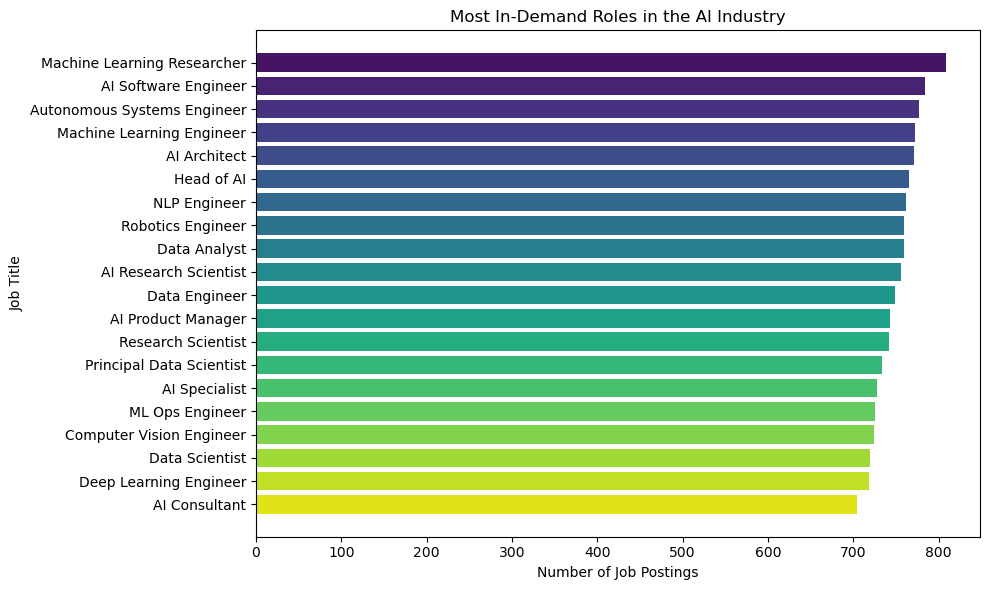

In [190]:
#PLOT: Which roles in the AI industry are in highest demand?

import matplotlib.pyplot as plt
import seaborn as sns

#set figure height dynamically based on number of roles

num_roles = len(high_demand_roles)
fig_height = max(6, num_roles * 0.3)  # Adjust 0.3 to fit spacing

#set color
colors = sns.color_palette('viridis', num_roles)

#plot--will limit this to top 5 when plotting in python

plt.figure(figsize=(10, fig_height))
plt.barh(high_demand_roles.index, high_demand_roles.values, color=colors) #set horizontal bar
plt.gca().invert_yaxis() # Invert y-axis so most in-demand roles appear at the top
plt.title('Most In-Demand Roles in the AI Industry') #set title
plt.xlabel('Number of Job Postings')  #label x axis 
plt.ylabel('Job Title') #label y axis
plt.tight_layout()
plt.show()

In [192]:
#Which industries offer the highest salaries?

#group by industry, calculate avg salary, order descending

avg_salary_by_industry = df.groupby('industry')['salary_usd'].mean().sort_values(ascending = False)

print("Average AI Role Salary by Industry:\n") 

avg_salary_by_industry  #limit as needed using .head() or .tail()


Average AI Role Salary by Industry:



industry
Consulting            117602.142157
Manufacturing         116162.888773
Media                 116127.730144
Education             116026.803347
Real Estate           115919.095333
Technology            115831.823937
Government            115694.321643
Finance               115323.398374
Telecommunications    115291.411234
Energy                115188.436475
Transportation        114837.802407
Retail                114776.363123
Healthcare            114433.883651
Automotive            113987.241176
Gaming                112979.574974
Name: salary_usd, dtype: float64

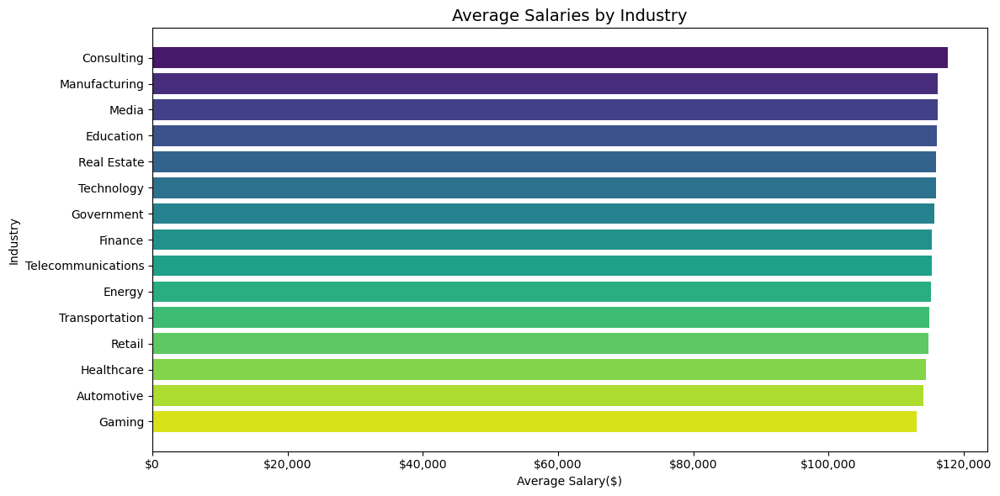

In [299]:
#PLOT: Which industries offer the highest salaries?

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick

#calculate number of industries to scale figure height
num_industries = len(avg_salary_by_industry)
fig_height = max(6, num_industries * 0.3)

#set colors
colors = sns.color_palette('viridis', num_industries)

#plot--will limit to top 5 when plotting in tableau

plt.figure(figsize=(12, fig_height))
bars = plt.barh(avg_salary_by_industry.index, avg_salary_by_industry.values, color=colors)
plt.gca().xaxis.set_major_formatter(mtick.StrMethodFormatter('${x:,.0f}'))  #format as currency
plt.gca().invert_yaxis() # Invert y-axis so highest salaries are at the top
plt.title('Average Salaries by Industry', fontsize=14)  #set title
plt.xlabel('Average Salary($)') #label x axis
plt.ylabel('Industry')  #label y axis
plt.tight_layout()
plt.show()

In [201]:
#Which companies offer the highest salaries?

#group by company name, return average salary, order descending

highest_paying_companies = df.groupby('company_name')['salary_usd'].mean().sort_values(ascending = False)

print("Highest Paying Companies in the AI Industry:\n")

highest_paying_companies #limit using .head() to find top 5 or .tail() to find lowest paying

Highest Paying Companies in the AI Industry:



company_name
TechCorp Inc                  121268.360204
Neural Networks Co            118660.359002
Autonomous Tech               116788.314815
Machine Intelligence Group    116784.366594
Cloud AI Solutions            116744.533123
Future Systems                116271.155208
DeepTech Ventures             115812.198439
Quantum Computing Inc         115322.491667
DataVision Ltd                115296.632563
Predictive Systems            114546.672650
Smart Analytics               114065.214671
Algorithmic Solutions         113609.087006
Advanced Robotics             113368.842162
Digital Transformation LLC    112815.544225
Cognitive Computing           112675.083333
AI Innovations                111511.771784
Name: salary_usd, dtype: float64

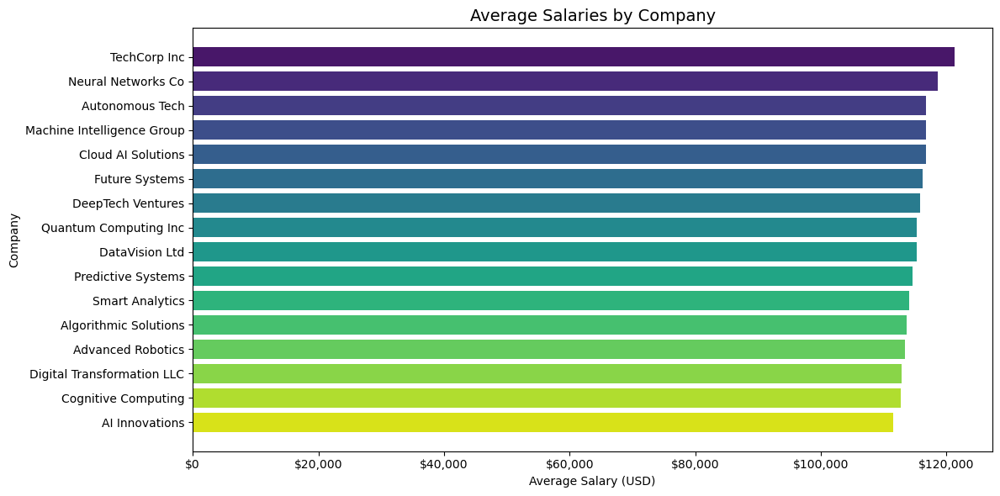

In [304]:
#PLOT: Which companies offer the highest salaries?

import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as mtick

#calculate number of companies to scale figure height
num_companies = len(highest_paying_companies)
fig_height = max(6, num_companies * 0.3)

#set colors
colors = sns.color_palette('viridis', num_companies)

#plot--will limit to top 5 companies when plotting in tableau

plt.figure(figsize=(12, fig_height))
bars = plt.barh(highest_paying_companies.index, highest_paying_companies.values, color=colors) #set horizontal bar
plt.gca().xaxis.set_major_formatter(mtick.StrMethodFormatter('${x:,.0f}')) #format as currency
plt.gca().invert_yaxis() #invert y-axis so highest salaries are at the top
plt.title('Average Salaries by Company', fontsize=14)  #set title
plt.xlabel('Average Salary (USD)') #label x axis
plt.ylabel('Company')  #label y axis
plt.tight_layout()
plt.show()

In [206]:
#Which industries offer the highest average benefits scores?

#group by industry, return avg benefits score, order descending
avg_benefits_score_by_industry = df.groupby('industry')['benefits_score'].mean().sort_values(ascending = False)

print("Average Benefits Score by Industry:\n")

avg_benefits_score_by_industry  #.head() to see top n scores or .tail() to see bottom n scores

Average Benefits Score by Industry:



industry
Real Estate           7.595035
Government            7.569038
Transportation        7.541725
Media                 7.541340
Technology            7.539466
Telecommunications    7.532197
Finance               7.524695
Healthcare            7.517854
Retail                7.500564
Education             7.471444
Manufacturing         7.471102
Gaming                7.466184
Consulting            7.441961
Energy                7.425717
Automotive            7.421078
Name: benefits_score, dtype: float64

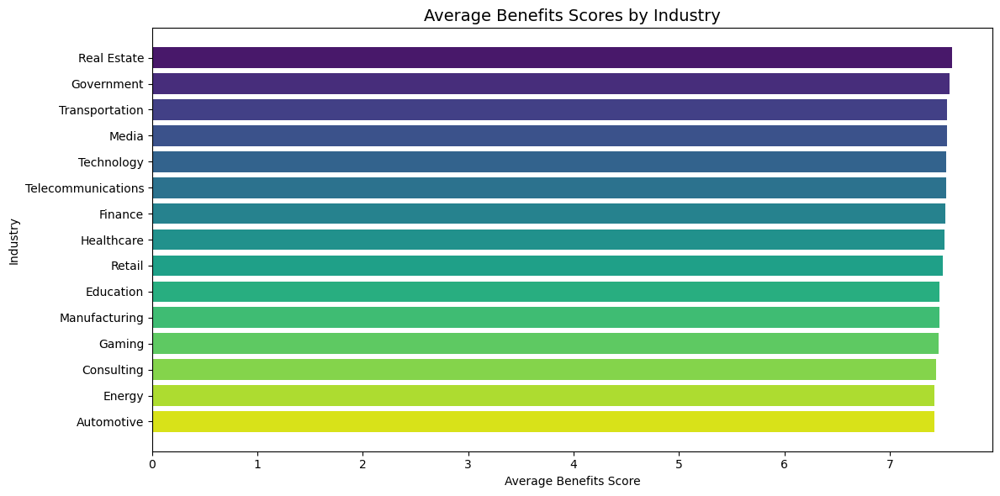

In [214]:
#PLOT: Which industries offer the highest average benefits scores?

import matplotlib.pyplot as plt
import seaborn as sns

#calculate number of industries to scale figure height
num_industries = len(avg_benefits_score_by_industry)
fig_height = max(6, num_industries * 0.3)

#set colors
colors = sns.color_palette('viridis', num_industries)

#plot--will limit to top 5 industries when plotting in tableau

plt.figure(figsize=(12, fig_height))
bars = plt.barh(avg_benefits_score_by_industry.index, avg_benefits_score_by_industry.values, color=colors) #set horizontal bar
plt.gca().invert_yaxis() #invert y-axis so highest benefits scores are at the top
plt.title('Average Benefits Scores by Industry', fontsize=14)  #set title
plt.xlabel('Average Benefits Score')  #label x axis
plt.ylabel('Industry')  #label y axis
plt.tight_layout()
plt.show()

In [235]:
#What are the average salaries by company size?

#group by company size, return avg salary, order descending

avg_salary_by_company_size = df.groupby('company_size')['salary_usd'].mean().sort_values(ascending = False)

print("Average Salary by Company Size:\n")

avg_salary_by_company_size


Average Salary by Company Size:



company_size
L    130322.451781
M    113600.237037
S    102146.930098
Name: salary_usd, dtype: float64

In [237]:
#What are the average benefits scores by company size?

avg_benefits_score_by_company_size = df.groupby('company_size')['benefits_score'].mean().sort_values(ascending = False)

print("Average Benefits Score by Company Size:\n")

avg_benefits_score_by_company_size

#can probably do a dual axis visual in tableau with avg salary score by company size (above)

Average Benefits Score by Company Size:



company_size
L    7.522289
S    7.499161
M    7.491371
Name: benefits_score, dtype: float64

<br><br>

__6. Time Series & Urgency__

- Perform various anaylses to explore monthly job posting trends and hiring urgency:
    - Do larger companies tend to post longer application windows?
    - How do hiring patterns vary across industries by month?
    - Are urgent job postings (shorter windows) more likely to be remote or hybrid?
    - Which industries have the highest share of urgent jobs?
    - Is there a correlation with urgency and salary/benefits score?
    - What is the distribution of days to apply (urgency); how many roles fall into urgent/non-urgent categories?

In [15]:
#What is the average job posting window by month?

#ensure posting_date and application_deadline are datetime

df['posting_date'] = pd.to_datetime(df['posting_date'])
df['application_deadline'] = pd.to_datetime(df['application_deadline'])

#create the job_posting_window column (duration in days)

df['job_posting_window'] = (df['application_deadline'] - df['posting_date']).dt.days

#extract the month from posting_date

df['job_posting_month'] = df['posting_date'].dt.to_period('M')

#group by month and calculate average posting window

avg_window_by_month = df.groupby('job_posting_month')['job_posting_window'].mean().round(2).reset_index()


print("Average Job Posting Window by Month:\n")

avg_window_by_month


Average Job Posting Window by Month:



,job_posting_month,job_posting_window
0,2024-01,42.23
1,2024-02,42.81
2,2024-03,43.14
3,2024-04,44.22
4,2024-05,44.86
5,2024-06,44.31
6,2024-07,42.85
7,2024-08,43.34
8,2024-09,42.93
9,2024-10,43.77


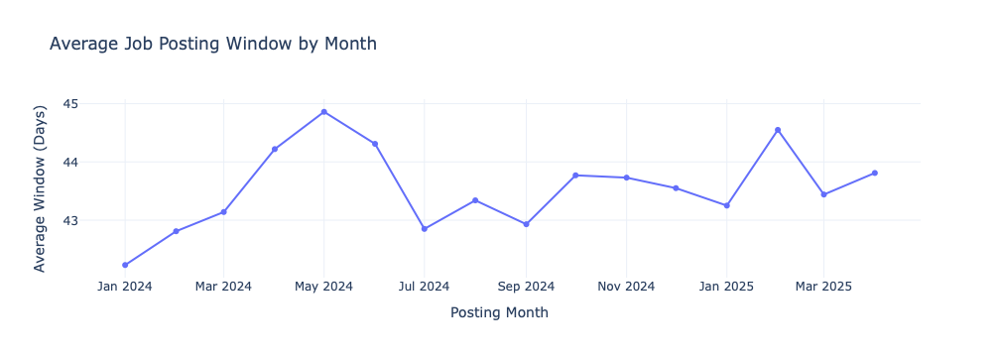

In [17]:
#PLOT: What is the average job posting window by month?

#convert job_posting_month to string for plotly

avg_window_by_month['job_posting_month'] = avg_window_by_month['job_posting_month'].astype(str)

import plotly.express as px

fig = px.line(
    avg_window_by_month,
    x='job_posting_month',  #set x axis
    y='job_posting_window',  #set y axis
    markers=True,
    title='Average Job Posting Window by Month',  #set title
    labels={'job_posting_month': 'Month', 'job_posting_window': 'Avg Days to Apply'},  #set labels
    template='plotly_white'
)

fig.update_layout(xaxis_title='Posting Month', yaxis_title='Average Window (Days)', height=400)
fig.show()

In [19]:
#Do larger companies tend to post longer application windows?

#create new column application_window_days by subtracting posting date from application deadline in datetime(day) format
df['application_window_days'] = (df['application_deadline'] - df['posting_date']).dt.days

#group by company size and calculate average application window

avg_application_window_by_company_size = df.groupby('company_size')['application_window_days'].mean().sort_values(ascending = False)

print("Average Application Window by Company Size:\n")

avg_application_window_by_company_size



Average Application Window by Company Size:



company_size
S    43.789095
M    43.435235
L    43.413766
Name: application_window_days, dtype: float64

In [21]:
#How do hiring patterns vary across industries by month?

#extract job posting month

df['job_posting_month'] = df['posting_date'].dt.to_period('M')

#group by job posting month and industry, count number of job postings

monthly_industry_postings = df.groupby(['job_posting_month', 'industry']).size().reset_index(name = 'job_count')

print("Monthly Job Postings by Industry:\n")

monthly_industry_postings 

Monthly Job Postings by Industry:



,job_posting_month,industry,job_count
0,2024-01,Automotive,67
1,2024-01,Consulting,72
2,2024-01,Education,69
3,2024-01,Energy,68
4,2024-01,Finance,56
...,...,...,...
235,2025-04,Real Estate,69
236,2025-04,Retail,72
237,2025-04,Technology,61
238,2025-04,Telecommunications,62


In [23]:
#How do hiring patterns vary across industries by month? (continued)

#pivot data to set industry as column and job counts by month as column for readability

monthly_industry_postings_pivot = monthly_industry_postings.pivot(index = 'job_posting_month', columns = 'industry', values = 'job_count')

print("Monthly Job Postings by Industry:\n")

monthly_industry_postings_pivot

Monthly Job Postings by Industry:



industry,Automotive,Consulting,Education,Energy,Finance,Gaming,Government,Healthcare,Manufacturing,Media,Real Estate,Retail,Technology,Telecommunications,Transportation
job_posting_month,,,,,,,,,,,,,,,
2024-01,67,72,69,68,56,53,58,61,59,77,52,68,77,63,53
2024-02,64,57,72,70,52,67,61,58,43,64,76,68,72,56,47
2024-03,54,55,57,50,63,69,70,47,82,76,56,52,68,66,67
2024-04,58,76,64,64,59,66,70,75,47,68,83,84,60,47,64
2024-05,83,63,70,64,57,68,66,66,65,65,52,55,50,66,65
2024-06,66,62,65,55,75,57,59,60,57,71,67,63,70,58,53
2024-07,58,63,55,57,67,63,53,76,57,55,72,70,71,71,71
2024-08,70,60,55,73,63,49,60,69,65,69,57,66,73,65,64
2024-09,66,58,55,64,57,46,68,59,62,47,54,73,63,64,59


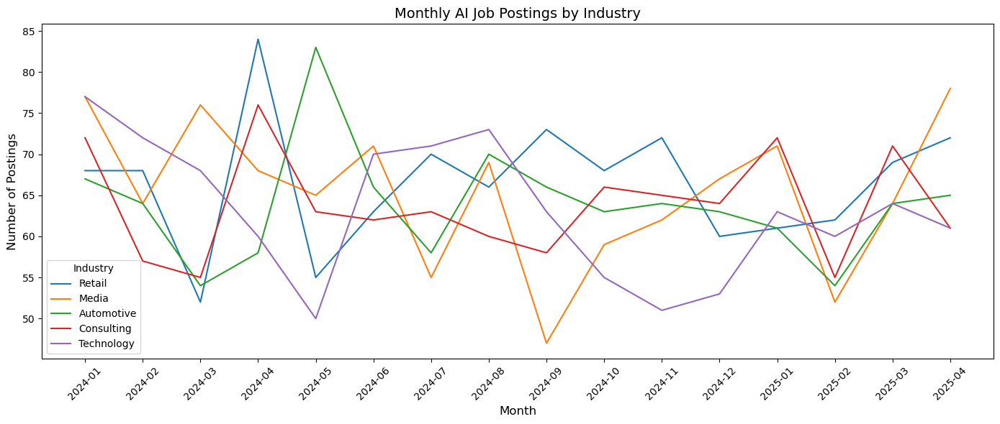

In [233]:
#PLOT: How do hiring patterns vary across industries by month?

import matplotlib.pyplot as plt

#limit to top 5 to prevent crowded plot

top_industries = df['industry'].value_counts().head(5).index
filtered_top_industries = monthly_industry_postings_pivot[top_industries]

#create a plot figure
plt.figure(figsize=(14,6))

#plot each industry as a separate line
for industry in filtered_top_industries.columns:
    plt.plot(filtered_top_industries.index.astype(str), #convert period to str
             filtered_top_industries[industry], #set y axis as job count for industry over time
             label=industry) #add label for legend so each industry is identifiable

plt.title("Monthly AI Job Postings by Industry", fontsize=14) #set title
plt.xlabel("Month", fontsize=12) #label xaxis
plt.ylabel("Number of Postings", fontsize=12) #label yaxis
plt.xticks(rotation = 45) #rotate tick marks as needed
plt.legend(title = 'Industry') #set legend
plt.tight_layout()
plt.show()

In [25]:
#Are urgent job postings (shorter windows) more likely to be remote or hybrid?

#column application window days created in previous question

df['application_window_days']

#define "short window" knowing that the avg application window is 43 days
# x <= 30 days is a reasonable "short window"

#create column 'is urgent' and set to <= 30 days, return values from application_window_days
#creates a boolean column- 'true' for urgent postings, 'false' for others

df['is_urgent'] = df['application_window_days'] <= 30

#group by remote ratio and calculate percent of postings that are urgent

urgent_by_remote = df.groupby('remote_ratio')['is_urgent'].mean().reset_index()

urgent_by_remote['percent_urgent'] = urgent_by_remote['is_urgent']*100

print("Remote Ratio by Job Posting Urgency:\n")

urgent_by_remote

#can change the number of days to apply from 30 to i.e. 15 or 50 to see differences

Remote Ratio by Job Posting Urgency:



,remote_ratio,is_urgent,percent_urgent
0,0,0.280985,28.098522
1,50,0.286513,28.651349
2,100,0.282927,28.292683


In [34]:
#Which industries have the highest share of urgent jobs?

#group by industry and create a dictionary to aggregate multiple times on a single column ('industry'), return total job count and number of urgent jobs
industry_urgency = df.groupby('industry').agg({
    'is_urgent': ['count', 'sum']
}).reset_index()

#rename columns

industry_urgency.columns = ['industry', 'total_jobs', 'urgent_jobs']

#create a new column for perecnt of jobs that are urgent in each industry, calculate percent urgent

industry_urgency['percent_urgent'] = (industry_urgency['urgent_jobs']/ industry_urgency['total_jobs']) * 100

#sort the table by percent urgent, order descending
industry_urgency.sort_values(by = ['percent_urgent'], ascending = False)





,industry,total_jobs,urgent_jobs,percent_urgent
8,Manufacturing,962,287,29.833680
11,Retail,1063,315,29.633114
12,Technology,1011,298,29.475767
13,Telecommunications,997,293,29.388164
3,Energy,976,285,29.200820
4,Finance,984,285,28.963415
5,Gaming,967,276,28.541882
10,Real Estate,1007,287,28.500497
0,Automotive,1020,289,28.333333
1,Consulting,1020,287,28.137255


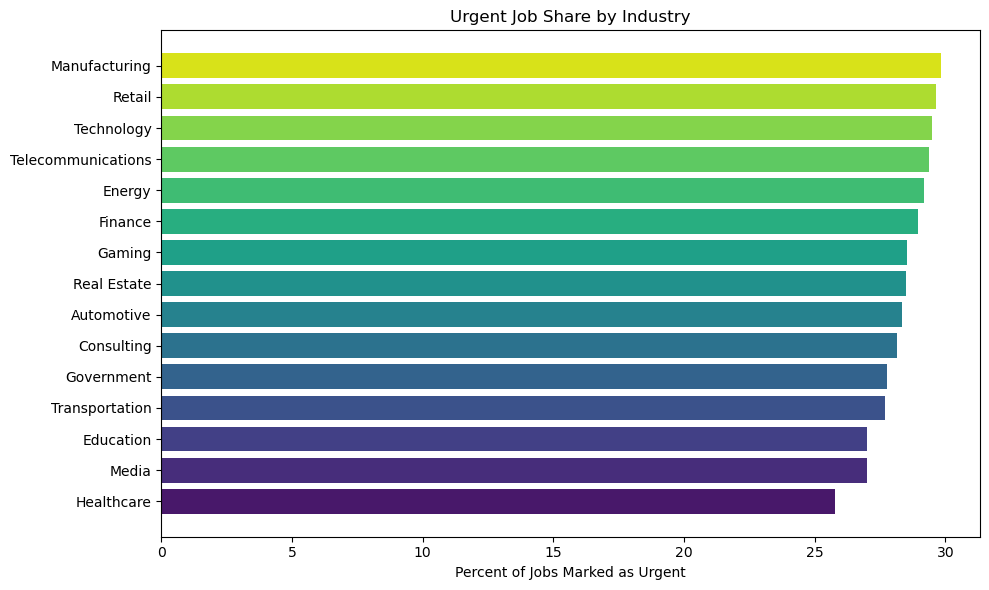

In [318]:
#PLOT: Which industries have the highest share of urgent jobs?

import seaborn as sns
import matplotlib.pyplot as plt

industry_urgency_sorted = industry_urgency.sort_values(by='percent_urgent', ascending=True)  #order by % urgent
num_industries = len(industry_urgency_sorted)

#set colors by industry
colors = sns.color_palette('viridis', num_industries)

plt.figure(figsize=(10, 6))
bars = plt.barh(   #set horizontal bar
    industry_urgency_sorted['industry'], #set y axis
    industry_urgency_sorted['percent_urgent'], #set x axis
    color=colors
)
plt.xlabel("Percent of Jobs Marked as Urgent") #label x axis
plt.title("Urgent Job Share by Industry") #set title
plt.tight_layout()
plt.show()

In [42]:
#Which roles have the highest share of urgent jobs?


#group by role and create a dictionary to aggregate multiple times on a single column ('role'), return total job count and number of urgent jobs
role_urgency = df.groupby('job_title').agg({
    'is_urgent': ['count', 'sum']
}).reset_index()

#rename columns
role_urgency.columns = ['job_title', 'total_jobs', 'urgent_jobs']

#create a new column for perecnt of jobs that are urgent in each industry, calculate percent urgent
role_urgency['percent_urgent'] = (role_urgency['urgent_jobs'] / role_urgency['total_jobs']) * 100

#sort the table by percent urgent, order descending
role_urgency = role_urgency.sort_values(by='percent_urgent', ascending=False)

role_urgency



,job_title,total_jobs,urgent_jobs,percent_urgent
4,AI Software Engineer,784,249,31.760204
3,AI Research Scientist,756,235,31.084656
12,Head of AI,765,235,30.718954
8,Data Analyst,759,228,30.039526
5,AI Specialist,728,215,29.532967
13,ML Ops Engineer,725,212,29.241379
9,Data Engineer,749,219,29.238985
14,Machine Learning Engineer,772,225,29.145078
2,AI Product Manager,743,215,28.936743
15,Machine Learning Researcher,808,228,28.217822


In [261]:
#Is there a correlation with urgency and salary/benefits score?

print("Correlate Urgency with Salary and Benefits Score:\n")

#group by is_urgent, return avg salary and benefits score

df.groupby('is_urgent')[['salary_usd', 'benefits_score']].mean()

#looks like no correlation really exists here

Correlate Urgency with Salary and Benefits Score:



,salary_usd,benefits_score
is_urgent,,
False,115679.090901,7.512895
True,114514.489182,7.482479


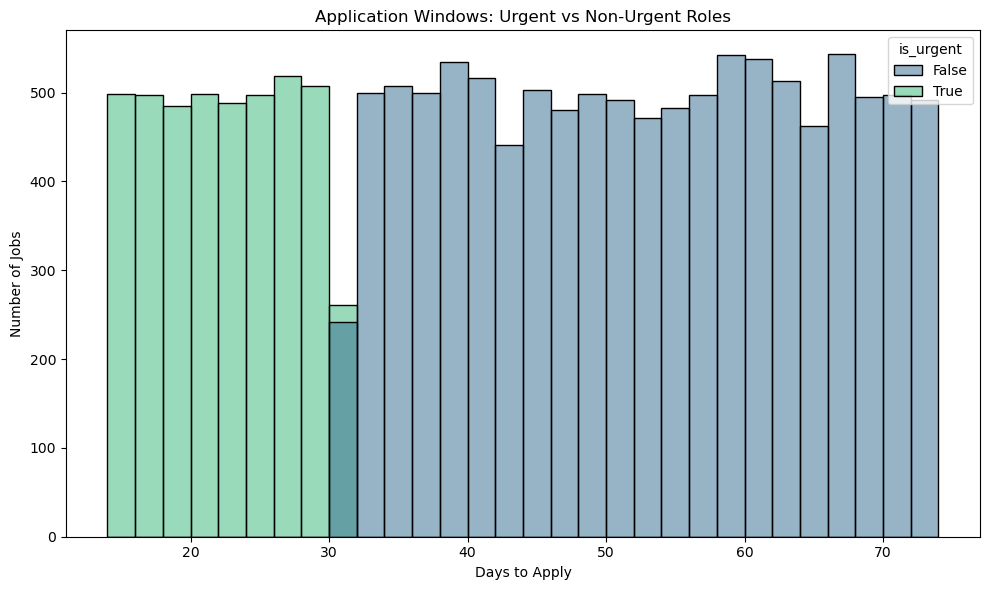

In [343]:
#What is the distribution of days to apply (urgency); how many roles fall into urgent/non-urgent categories?

import seaborn as sns

plt.figure(figsize=(10,6))
sns.histplot(  #set as histogram
    data = df,
    x = 'days_to_apply', #set x axis
    hue = 'is_urgent', #color by urgency type
    bins = 30,  #set number of bins
    kde = False,   #no average line
    palette = 'viridis'
)
plt.title('Application Windows: Urgent vs Non-Urgent Roles')  #set title
plt.xlabel('Days to Apply')  #label x axis
plt.ylabel('Number of Jobs')  #label y axis
plt.tight_layout()
plt.show()

In [51]:
#Export to Tableau

#1. Salary Stats by Country

save_path = '/Users/danielmapes/Desktop/Capstone Project/'

salary_by_country = df.groupby('company_location', observed = True)['salary_usd']\
                      .agg(['max', 'min', 'median', 'mean'])\
                      .round(2)\
                      .reset_index() #convert index to column for tableau

salary_by_country.to_csv(save_path + 'salary_by_country.csv', index = False)



In [59]:
#Export to Tableau

#2. Top 5 Countries via max, min, mean, median salaries

save_path = '/Users/danielmapes/Desktop/Capstone Project/'

top_5_country_salary_stats = df.groupby('company_location', observed=True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2).reset_index() #convert index to column for tableau

top_5_country_salary_stats.to_csv(save_path + 'top_5_salary_stats_by_country.csv', index = False)

In [61]:
#Export to Tableau

#3. Bottom 5 countries via max, min, mean, median salaries

save_path = '/Users/danielmapes/Desktop/Capstone Project/'

bottom_salary_stats = df.groupby('company_location', observed=True)['salary_usd'].agg(['max', 'min', 'median', 'mean']).round(2).reset_index() #convert index to column for tableau


bottom_salary_stats.to_csv(save_path + 'bottom_5_salary_stats_by_country.csv', index = False)




In [67]:
#Export to Tableau

#4. Benefits scores by country

save_path = '/Users/danielmapes/Desktop/Capstone Project/'

benefits_score_by_country = df.groupby('company_location', observed = True)['benefits_score'].agg(['max', 'min', 'median', 'mean']).round(2).reset_index() #convert index to column for tab

benefits_score_by_country.to_csv(save_path + 'benefits_score_by_country.csv', index = False)



In [77]:
#Export to Tableau

#5. How many jobs is each country posting monthly?

save_path = '/Users/danielmapes/Desktop/Capstone Project/'

monthly_postings_by_country = df.groupby(['company_location', 'job_posting_month']).size().reset_index(name = 'job_count').reset_index() #convert index to column for tableau

monthly_postings_by_country.to_csv(save_path + 'montly_postings_by_country.csv', index = False)

In [85]:
#Export to Tableau

#6. Total monthly job postings by country (limit to top 5 in tableau)

save_path = '/Users/danielmapes/Desktop/Capstone Project/'

total_monthly_postings_by_country = monthly_postings_by_country.groupby('company_location')['job_count'].sum().reset_index() #convert index to column for tableau

total_monthly_postings_by_country.to_csv(save_path + 'total_monthly_postings_by_country.csv', index = False)

In [108]:
#Export to Tableau

#7. Top skills

save_path = '/Users/danielmapes/Desktop/Capstone Project/'

top_skills.to_csv(save_path + 'top_skills.csv', index = False)

In [110]:
#Export to Tableau

#8. Skill Pairs

from itertools import combinations
from collections import Counter
import pandas as pd


skills_series = df['required_skills'].dropna()


skill_sets = [
    sorted([skill.strip().lower() for skill in skills.split(',') if skill.strip()])
    for skills in skills_series
]


pair_counter = Counter()

for skill_list in skill_sets:
    if len(skill_list) >= 2:
        pairs = combinations(skill_list, 2)
        pair_counter.update(pairs)

skill_pairs = pd.DataFrame([
    {'skill_1': pair[0], 'skill_2': pair[1], 'number_of_times_requested_together': count}
    for pair, count in pair_counter.items()
]).sort_values(by='number_of_times_requested_together', ascending=False).reset_index(drop=True)


save_path = '/Users/danielmapes/Desktop/Capstone Project/'
skill_pairs.to_csv(save_path + 'skill_pairs.csv', index=False)

In [142]:
#Export to Tableau

#Average Salary by Skill

save_path = '/Users/danielmapes/Desktop/Capstone Project/'

avg_salary_by_skill.to_csv(save_path + 'avg_salary_by_skill.csv', index = False)

In [161]:
#Export to Tableau

#Percent of jobs that are "urgent" by industry

save_path = '/Users/danielmapes/Desktop/Capstone Project/'

industry_urgency.to_csv(save_path + 'industry_urgency.csv', index=False)

In [46]:
#Export to Tableau

#Role urgency

save_path = '/Users/danielmapes/Desktop/Capstone Project/'

role_urgency.to_csv(save_path + 'role_urgency.csv', index = False)
